# OpenAQ - Filtrage du dataset via SQL (DuckDB)

In [1]:
# !pip install statsforecast

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
# ================================================================
# INPUTS: change depending on the data you're working with

import os
from openaq_anomaly_prediction.config import Configuration as cfg

PARQUET_FILEPATH = os.path.join(cfg.DATA_EXPORT_PATH, "seoul_complete.int.parquet")
# PARQUET_FILEPATH = os.path.join("seoul_complete.int.parquet")

<br>

---
### ***↪***&nbsp;&nbsp;**Imports**



In [4]:
# ================================================================
# IMPORTS: python packages and settings (don't change anything)
import time
import requests

import duckdb
import numpy as np
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq
import pyarrow.dataset as ds
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.graph_objs import Figure as PlotlyFigure

from pprint import pprint

# CONFIG: to display all rows/columns of a dataframe (debug)
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.width", 1000)
sep_length = 64  # Only so we can print separators of a fixed length

# PyArrow
parquet_file = pq.ParquetFile(PARQUET_FILEPATH)

# DuckDB:
con = duckdb.connect()
# con.execute(f"SET TimeZone='{CITY_TIMEZONE}';")  # available for each row/location, no need to set globally
con.execute(
    f"CREATE OR REPLACE VIEW measurements AS SELECT * FROM read_parquet('{PARQUET_FILEPATH}')"
)

In [5]:
# ================================================================
# UTILS: helper functions (don't change anything)

def print_summary(df: pd.DataFrame) -> None:
    """Print a summary of the useful stats of a dataframe."""
    # Summary
    print(f"{'='*sep_length}\nSUMMARY: Custom DataFrame\n{'-'*sep_length}")
    print(f"Total rows: {len(df)}")
    print(f"From: {df["period.datetimeTo.local"].min()}")
    print(f"To  : {df["period.datetimeTo.local"].max()}")
    print(f"{'-'*int(sep_length/3)*2}")
    print(f"Unique locations: {df["location_id"].nunique()}")
    print(f"Unique pollutants: {df["name"].nunique()}")
    print(f"{'-'*int(sep_length/3)*2}")
    for pollutant in df["name"].unique():
        print(f"> {pollutant}")

def print_summary_timeseries(df: pd.DataFrame, **kwargs) -> None:
    """Print a summary of the useful stats of a TIME-SERIES dataframe."""

    title = kwargs.get("title", "Time-series DataFrame")

    memory_usage = df.memory_usage(index=True, deep=True).sum() / (1024**2)

    # Summary
    print(f"{'='*sep_length}\nSUMMARY: {title}\n{'-'*sep_length}")
    print(f"Total rows  : {len(df)}")
    print(f"Memory usage: {memory_usage:.2f} MB")

    if "datetimeTo_local" in df.columns:
        datetime_column = "datetimeTo_local"
    elif "ds" in df.columns:
        datetime_column = "ds"
    else:
        datetime_column = "datetimeTo_utc"
    print(f"From: {df[datetime_column].min()} ({datetime_column})")
    print(f"To  : {df[datetime_column].max()} ({datetime_column})")

    location_id_column = "location_id" if "location_id" in df.columns else "unique_id"
    print(f"{'-'*int(sep_length/3)*2}")
    print(f"Unique locations: {df[location_id_column].nunique()}")

    if "name" in df.columns:
        print(f"Unique pollutants: {df["name"].nunique()}")
        print(f"{'-'*int(sep_length/3)*1}")
        for pollutant in df["name"].unique():
            print(f"> {pollutant}")

<br>

---
### ***↪***&nbsp;&nbsp;**Load the DataFrame**


#### Résumé du fichier de base (parquet)

In [6]:
# ================================================================
# SUMMARY: for information only (don't change anything)

# DuckDB
db_start_date = con.execute("""
    SELECT min("period.datetimeTo.local")
    FROM measurements
""", {}).fetchone()[0]

db_end_date = con.execute("""
    SELECT max("period.datetimeTo.local")
    FROM measurements
""", {}).fetchone()[0]

db_unique_locations_count = con.execute("""
    SELECT count(DISTINCT "location_id")
    FROM measurements
""", {}).fetchone()[0]

db_unique_pollutants_count = con.execute("""
    SELECT count(DISTINCT "name")
    FROM measurements
""", {}).fetchone()[0]

db_unique_pollutants = con.execute("""
    SELECT DISTINCT "name"
    FROM measurements
""", {}).fetchnumpy()["name"].tolist()  # could use a list comprehension too
#""", {}).df().values.flatten()

# Summary
print(f"{'='*sep_length}\nSUMMARY: {PARQUET_FILEPATH}\n{'-'*sep_length}")
print(f"Total rows: {parquet_file.metadata.num_rows}")
print(f"From: {db_start_date}")
print(f"To  : {db_end_date}")
print(f"{'-'*int(sep_length/3)*2}")
print(f"Unique locations: {db_unique_locations_count}")
print(f"Unique pollutants: {db_unique_pollutants_count}")
print(f"{'-'*int(sep_length/3)*2}")
for pollutant in db_unique_pollutants:
    print(f"> {pollutant}")
print()

# Display a list of all columns available in the dataframe
# print("Available Columns:")
# pprint(parquet_file.schema.names)

SUMMARY: /home/deniscck/code/openaq-anomaly-prediction/data/export/seoul_complete.int.parquet
----------------------------------------------------------------
Total rows: 4918548
From: 2024-04-30 17:00:00+02:00
To  : 2025-12-16 03:00:00+01:00
------------------------------------------
Unique locations: 58
Unique pollutants: 6
------------------------------------------
> co ppm
> o3 ppm
> pm25 µg/m³
> so2 ppm
> no2 ppm
> pm10 µg/m³



#### Exemples de filtres

In [7]:
# ================================================================
# SELECT the columns (use -- to comment out a column or /* */ for multiline)

query = """
    CREATE OR REPLACE VIEW bronze_measurements AS
    SELECT
        location_id,
        sensor_id,
        name,
        value,

        "period.datetimeFrom.local",
        "period.datetimeFrom.local",
        "period.datetimeTo.local",
        "period.datetimeTo.utc",
        "datetimeWeather.local",
        timezone,
        "coordinates.latitude",
        "coordinates.longitude",

        -- parameter.id,
        -- parameter.name,
        -- parameter.units,
        "parameter.displayName",

        -- period.datetimeFrom.utc,
        -- location.datetimeFirst.utc,
        -- location.datetimeLast.utc,
        -- timestampTo,

        -- location_name,
        -- country.code,
        -- owner.name,
        -- provider.name,
        -- datetimeWeather.utc,
        -- weather_latitude,
        -- weather_longitude,

        elevation,
        temperature_2m,
        relative_humidity_2m,
        dew_point_2m,
        apparent_temperature,
        precipitation,
        rain,
        snowfall,
        snow_depth,
        shortwave_radiation,
        direct_radiation,
        diffuse_radiation,
        global_tilted_irradiance,
        direct_normal_irradiance,
        terrestrial_radiation,
        weather_code,
        pressure_msl,
        surface_pressure,
        cloud_cover,
        cloud_cover_low,
        cloud_cover_mid,
        cloud_cover_high,
        vapour_pressure_deficit,
        et0_fao_evapotranspiration,
        wind_speed_100m,
        wind_speed_10m,
        wind_direction_10m,
        wind_direction_100m,
        wind_gusts_10m,
        is_day,

    FROM measurements
"""

custom_df = con.execute(query, {}).df()

In [8]:
# ================================================================
# FILTERS: create filters corresponding to SQL syntax (DuckDB)
# Here are examples of what you can do, take it in your own hands
# or get help with your favourite AI friend.

def dont_run_its_an_example() -> None:

    # -------------------------------------------------------------
    # Filter by DATE (be mindful of timezones)
    query = """
        SELECT
            *
        FROM bronze_measurements
        WHERE "period.datetimeTo.local" >= $start_date
          AND "period.datetimeTo.local" <= $end_date
    """
    custom_df = con.execute(query, {
        "start_date": "2025-01-01 00:00:00+09:00",
        "end_date": "2025-12-31 23:59:59+09:00"
    }).df()

    # -------------------------------------------------------------
    # Filter by LOCATION_ID

    # This works perfectly fine in modern DuckDB
    query = """
        SELECT
            *
        FROM bronze_measurements
        WHERE location_id IN $location_ids
    """
    # This is "better" because it turns the list in a temporary table
    query = """
        SELECT
            *
        FROM bronze_measurements
        WHERE location_id IN (SELECT unnest($location_ids))
    """

    custom_df = con.execute(query, {
        "location_ids": [2622825, 2623440, 2623080],
    }).df()

    # -------------------------------------------------------------
    # Filter by POLLUTANT ("name")

    # Same as LOCATION_ID
    query = """
        SELECT
            *
        FROM bronze_measurements
        WHERE name IN (SELECT unnest($pollutants))
    """
    custom_df = con.execute(query, {
        "pollutants": ["pm25 µg/m³", "pm10 µg/m³"],
    }).df()


In [9]:
#  # -------------------------------------------------------------
# # Query Example

# query = """
#     SELECT
#         "period.datetimeTo.local",
#         "datetimeWeather.local"
#     FROM bronze_measurements
#     WHERE value < 10000
#       AND "period.datetimeTo.local" >= $start_date
#       AND "period.datetimeTo.local" <= $end_date
#       -- AND location_id IN (SELECT unnest($location_ids))
#       -- AND name IN (SELECT unnest($pollutants))
# """
# custom_df = con.execute(query, {
#     "start_date": "2025-12-01 00:00:00+09:00",
#     "end_date": "2025-12-31 23:59:59+09:00",
#     # "location_ids": [2622825, 2623440, 2623080],
#     # "pollutants": ["pm25 µg/m³"],
# }).df()

# # Stats
# memory_usage = custom_df.memory_usage(index=True, deep=True).sum() / (1024**2)
# print(f"Number of rows: {len(custom_df)}")
# print(f"Memory usage: {memory_usage:.2f} MB")
# # print_summary(custom_df)


#### DuckDB Views

In [10]:
# ================================================================
# TIME-SERIES: BRONZE

query = """
    CREATE OR REPLACE VIEW bronze_timeseries AS
    SELECT
        location_id,
        sensor_id,
        "parameter.displayName" AS displayName,
        name,
        value,

        -- We use both the period.datetimeTo.utc and the timezone to "recompute" the local time
        -- The local time is only used for feature engineering, not as the time-series index

        "period.datetimeTo.utc"::TIMESTAMPTZ AS datetimeTo_utc,
        ("period.datetimeTo.utc"::TIMESTAMPTZ AT TIME ZONE timezone)::TIMESTAMP AS datetimeTo_local,
        timezone,

        "coordinates.latitude" AS latitude,
        "coordinates.longitude" AS longitude,

        -- parameter.id,
        -- parameter.name,
        -- parameter.units,

        -- period.datetimeFrom.utc,
        -- period.datetimeTo.local,
        -- location.datetimeFirst.utc,
        -- location.datetimeLast.utc,
        -- timestampTo,

        location_name,
        -- country.code,
        -- owner.name,
        -- provider.name,
        -- datetimeWeather.utc,
        -- weather_latitude,
        -- weather_longitude,

        elevation,
        temperature_2m,
        relative_humidity_2m,
        dew_point_2m,
        apparent_temperature,
        precipitation,
        rain,
        snowfall,
        snow_depth,
        shortwave_radiation,
        direct_radiation,
        diffuse_radiation,
        global_tilted_irradiance,
        direct_normal_irradiance,
        terrestrial_radiation,
        weather_code,
        pressure_msl,
        surface_pressure,
        cloud_cover,
        cloud_cover_low,
        cloud_cover_mid,
        cloud_cover_high,
        vapour_pressure_deficit,
        et0_fao_evapotranspiration,
        wind_speed_100m,
        wind_speed_10m,
        wind_direction_10m,
        wind_direction_100m,
        wind_gusts_10m,
        is_day,

    FROM measurements
"""
custom_df = con.execute(query, {})


# ================================================================
# TIME-SERIES: PERFECT GRID
# 1 row every hour for each sensor for all locations

query = """
    CREATE OR REPLACE VIEW perfect_grid AS

    -- 1. Define the time range
    WITH time_range AS (
        SELECT
            min(datetimeTo_local) as start_dt,
            max(datetimeTo_local) as end_dt
        FROM bronze_timeseries
    ),

    -- 2. Generate every hour in that range
    grid AS (
        --SELECT generate_series(start_dt, end_dt, interval '1 hour') as ds
        SELECT unnest(generate_series(start_dt, end_dt, interval '1 hour'))::TIMESTAMP as ds
        FROM time_range
    ),

    -- 3. Get the unique combination of Locations and Sensors
    -- This ensures we know which sensors belong to which locations
    entities AS (
        SELECT DISTINCT location_id, sensor_id, name, timezone
        FROM bronze_timeseries
    ),

    -- 4. Create the "Empty Cube": Every Sensor x Every Hour
    perfect_grid AS (
        SELECT
            e.location_id,
            e.sensor_id,
            e.name,
            e.timezone,
            g.ds
        FROM entities e
        CROSS JOIN grid g
    )

    SELECT * FROM perfect_grid;
"""
custom_df = con.execute(query, {})


# ================================================================
# TIME-SERIES: SILVER with PERFECT_GRID

query = """
    CREATE OR REPLACE VIEW silver_timeseries_grid AS
    SELECT

    -- MEASUREMENTS ==========================

        /* SENSOR METADATA                  */
            p.location_id,
            p.sensor_id,
            -- t.displayName,
            p.name,

        /* LOCATION FEATURES                */
            -- Use FIRST_VALUE with IGNORE NULLS to fill gaps in static metadata (for NaN rows)
            FIRST_VALUE(t.location_name IGNORE NULLS) OVER (PARTITION BY p.location_id) AS location_name,
            FIRST_VALUE(t.latitude IGNORE NULLS) OVER (PARTITION BY p.location_id) AS latitude,
            FIRST_VALUE(t.longitude IGNORE NULLS) OVER (PARTITION BY p.location_id) AS longitude,
            FIRST_VALUE(t.elevation IGNORE NULLS) OVER (PARTITION BY p.location_id) AS elevation,
            -- t.location_name,
            -- t.latitude,
            -- t.longitude,
            -- t.elevation,

        /* POLLUTANT FEATURES               */
            -- Set values >= 10,000 to NULL for imputation later
            CAST(CASE WHEN t.value >= 10000 THEN NULL ELSE t.value END AS DOUBLE) AS value,

            /*
            -- The value from the previous row (1 hour lag)
            LAG(value) OVER (PARTITION BY t.sensor_id ORDER BY t.datetimeTo_local) AS prev_value,

            -- 24-hour moving average
            AVG(value) OVER (
                PARTITION BY sensor_id
                ORDER BY datetimeTo_local
                ROWS BETWEEN 23 PRECEDING AND CURRENT ROW
            ) AS rolling_avg_24h,
            */

        /* TIME FEATURES                    */
            -- If datetimeTo_utc is missing, calculate UTC from the local grid time
            COALESCE(
                t.datetimeTo_utc,
                (p.ds AT TIME ZONE p.timezone)
            ) AS datetimeTo_utc,
            -- t.datetimeTo_utc,
            p.ds AS datetimeTo_local,
            p.timezone,

            /*
            EXTRACT(HOUR FROM datetimeTo_local)     AS hour_of_day,
            EXTRACT(month FROM datetimeTo_local)    AS month,
            EXTRACT(day FROM datetimeTo_local)      AS day_of_month,
            EXTRACT(dow FROM datetimeTo_local)      AS day_of_week, -- 0 (Sun) to 6 (Sat)
            EXTRACT(isodow FROM datetimeTo_local)   AS day_of_week_iso, -- 1 (Mon) to 7 (Sun)
            EXTRACT(doy FROM datetimeTo_local)      AS day_of_year,
            EXTRACT(week FROM datetimeTo_local)     AS week_of_year,
            EXTRACT(quarter FROM datetimeTo_local)  AS quarter,

            -- Weekend flag (Saturday=6, Sunday=0)
            CASE WHEN EXTRACT(dow FROM datetimeTo_local) IN (0, 6) THEN 1 ELSE 0 END AS is_weekend,

            -- Normalizing hour to a circle (0 to 2*PI)
            sin(2 * pi() * EXTRACT(hour FROM datetimeTo_local) / 24) AS hour_sin,
            cos(2 * pi() * EXTRACT(hour FROM datetimeTo_local) / 24) AS hour_cos

            -- Business Hours flag (e.g., 08:00 to 18:00)
            CASE WHEN EXTRACT(hour FROM datetimeTo_local) BETWEEN 8 AND 18 THEN 1 ELSE 0 END AS is_business_hours,
            */

    -- WEATHER ===============================
        /* ATMOSPHERIC FEATURES             */
            t.temperature_2m,
            t.relative_humidity_2m,
            t.dew_point_2m,
            t.apparent_temperature,
            t.pressure_msl,
            t.surface_pressure,
            t.weather_code,

        /* PRECIPITATION FEATURES           */
            t.precipitation,
            t.rain,
            t.snowfall,
            t.snow_depth,

        /* RADIATION/DAYLIGHT FEATURES      */
            t.shortwave_radiation,
            t.direct_radiation,
            t.diffuse_radiation,
            t.global_tilted_irradiance,
            t.direct_normal_irradiance,
            t.terrestrial_radiation,
            t.is_day,

        /* CLOUD & MOISTURE FEATURES        */
            t.cloud_cover,
            t.cloud_cover_low,
            t.cloud_cover_mid,
            t.cloud_cover_high,
            t.vapour_pressure_deficit,
            t.et0_fao_evapotranspiration,

        /* WIND FEATURES                    */
            t.wind_speed_100m,
            t.wind_speed_10m,
            t.wind_direction_10m,
            t.wind_direction_100m,
            t.wind_gusts_10m,

    FROM perfect_grid p
    LEFT JOIN bronze_timeseries t
    ON p.ds = t.datetimeTo_local
    AND p.sensor_id = t.sensor_id
"""
custom_df = con.execute(query, {})


# ================================================================
# TIME-SERIES: GOLD with PIVOT

# query = """
#     CREATE OR REPLACE VIEW gold_timeseries_wide AS
#     SELECT
#         location_id,
#         location_name,
#         timezone,
#         datetimeTo_utc,
#         datetimeTo_local,
#         latitude,
#         longitude,
#         -- Pivot the specific pollutants you need
#         MAX(CASE WHEN name = 'pm25 µg/m³' THEN value END) AS pm25,
#         MAX(CASE WHEN name = 'no2 µg/m³' THEN value END) AS no2,
#         MAX(CASE WHEN name = 'o3 µg/m³' THEN value END) AS o3,
#         -- Include your weather features (they are already 1 value per hour)
#         MAX(temperature_2m) AS temperature_2m,
#         MAX(relative_humidity_2m) AS humidity
#     FROM silver_timeseries_grid
#     GROUP BY 1, 2, 3, 4, 5, 6, 7;
# """
# custom_df = con.execute(query, {})


# ================================================================
# TIME-SERIES: GOLD Time Features (Fourier Terms)

# query = """
# CREATE OR REPLACE VIEW gold_features_time AS
#     WITH time_indices AS (
#         SELECT
#             *,
#             -- 1. Create raw "position" indices for each cycle
#             EXTRACT(hour FROM datetimeTo_local) AS hr,
#             (EXTRACT(dow FROM datetimeTo_local) * 24 + EXTRACT(hour FROM datetimeTo_local)) AS wk_hr,
#             (EXTRACT(doy FROM datetimeTo_local) * 24 + EXTRACT(hour FROM datetimeTo_local)) AS yr_hr
#         FROM silver_timeseries_grid -- or your wide pivot table
#     )
#     SELECT
#         *,
#         ---------------------------------------------------------
#         -- DAILY FOURIER (P=24)
#         ---------------------------------------------------------
#         -- k=1: General 24h cycle
#         sin(2 * pi() * 1 * hr / 24) AS daily_sin_k1,
#         cos(2 * pi() * 1 * hr / 24) AS daily_cos_k1,
#         -- k=2: 12h harmonic for bimodal (double) traffic peaks
#         sin(2 * pi() * 2 * hr / 24) AS daily_sin_k2,
#         cos(2 * pi() * 2 * hr / 24) AS daily_cos_k2,

#         ---------------------------------------------------------
#         -- WEEKLY FOURIER (P=168)
#         ---------------------------------------------------------
#         sin(2 * pi() * 1 * wk_hr / 168) AS weekly_sin_k1,
#         cos(2 * pi() * 1 * wk_hr / 168) AS weekly_cos_k1,

#         ---------------------------------------------------------
#         -- YEARLY FOURIER (P=8766)
#         ---------------------------------------------------------
#         sin(2 * pi() * 1 * yr_hr / 8766) AS yearly_sin_k1,
#         cos(2 * pi() * 1 * yr_hr / 8766) AS yearly_cos_k1,

#         ---------------------------------------------------------
#         -- EXTRA RECOMMENDED BINARY FLAGS
#         ---------------------------------------------------------
#         CASE WHEN EXTRACT(dow FROM datetimeTo_local) IN (0, 6) THEN 1 ELSE 0 END AS is_weekend,
#         -- Add a trend index (useful for MLForecast/XGBoost to see long-term growth)
#         row_number() OVER (PARTITION BY location_id ORDER BY datetimeTo_local) AS time_index,


#         ---------------------------------------------------------
#         -- HOLIDAY FLAG (FROM A MAPPING TABLE)
#         ---------------------------------------------------------
#         -- COALESCE(h.is_holiday, 0) AS is_holiday,

#     FROM time_indices;
# """
# custom_df = con.execute(query, {})




# # ================================================================
# # DuckDB QUERY: timeseries_df

# start_time = time.perf_counter()

# query = """
#     SELECT
#         *
#     -- FROM silver_timeseries
#     FROM silver_timeseries_grid

#     WHERE datetimeTo_local >= $start_date
#       AND datetimeTo_local <= $end_date
#       AND name IN (SELECT unnest($pollutants))
#       -- AND location_id IN (SELECT unnest($location_ids))

#     ORDER BY location_id, sensor_id, datetimeTo_local ASC
# """
# timeseries_df = con.execute(query, {
#     # "start_date": "2024-11-01 00:00:00+09:00",
#     # "end_date": "2025-10-31 23:59:59+09:00",
#     "start_date": "2024-08-01 10:00:00",
#     "end_date": "2024-09-01 23:59:59",
#     # "start_date": "2024-06-14 00:00:00+09:00",
#     # "end_date": "2024-07-13 23:59:59+09:00",
#     # "location_ids": [2622825, 2623440, 2623080],
#     # "location_ids": [2623344],
#     "pollutants": ["pm25 µg/m³"],
# }).df()

# print(f"Request finished in {time.perf_counter() - start_time:.2f}s")

# # Stats
# print_summary_timeseries(timeseries_df)

# # Check the Bronze View (should be TIMESTAMPTZ)
# print(f"{'='*sep_length}\nBronze View Schema")
# display(con.execute("DESCRIBE SELECT datetimeTo_local FROM bronze_timeseries").df())

# # Check the Silver View (the joined one)
# print(f"\n\n{'='*sep_length}\nSilver View Schema")
# display(con.execute("DESCRIBE SELECT datetimeTo_local FROM silver_timeseries_grid").df())

# print(f"\n\n{'='*sep_length}")
# timeseries_df[["location_id", "sensor_id", "datetimeTo_utc", "datetimeTo_local"]].head(5)

# print(f"\n\n{'='*sep_length}")
# print(timeseries_df[["datetimeTo_utc", "datetimeTo_local"]].count())

# # # Calculate the delta in hours
# # timeseries_df['diff_hours'] = (timeseries_df['datetimeTo_local'] -
# #                                timeseries_df['datetimeTo_utc'].dt.tz_localize(None)).dt.total_seconds() / 3600

# # # Check the unique offsets found per timezone
# # verification = timeseries_df.groupby('timezone')['diff_hours'].unique()
# # print(f"\n\n{'='*sep_length}\nTimezone Offset Verification")
# # print(verification)

#### Archives

In [11]:
# # ================================================================
# # TIME-SERIES: BRONZE

# query = """
#     CREATE OR REPLACE VIEW bronze_timeseries AS
#     SELECT
#         location_id,
#         sensor_id,
#         "parameter.displayName" AS displayName,
#         name,
#         value,

#         -- We use both the period.datetimeTo.utc and the timezone to "recompute" the local time
#         -- The local time is only used for feature engineering, not as the time-series index

#         "period.datetimeTo.utc"::TIMESTAMPTZ AS datetimeTo_utc,
#         ("period.datetimeTo.utc"::TIMESTAMPTZ AT TIME ZONE timezone) AS datetimeTo_local,
#         timezone,

#         "coordinates.latitude" AS latitude,
#         "coordinates.longitude" AS longitude,

#         -- parameter.id,
#         -- parameter.name,
#         -- parameter.units,

#         -- period.datetimeFrom.utc,
#         -- period.datetimeTo.local,
#         -- location.datetimeFirst.utc,
#         -- location.datetimeLast.utc,
#         -- timestampTo,

#         location_name,
#         -- country.code,
#         -- owner.name,
#         -- provider.name,
#         -- datetimeWeather.utc,
#         -- weather_latitude,
#         -- weather_longitude,

#         elevation,
#         temperature_2m,
#         relative_humidity_2m,
#         dew_point_2m,
#         apparent_temperature,
#         precipitation,
#         rain,
#         snowfall,
#         snow_depth,
#         shortwave_radiation,
#         direct_radiation,
#         diffuse_radiation,
#         global_tilted_irradiance,
#         direct_normal_irradiance,
#         terrestrial_radiation,
#         weather_code,
#         pressure_msl,
#         surface_pressure,
#         cloud_cover,
#         cloud_cover_low,
#         cloud_cover_mid,
#         cloud_cover_high,
#         vapour_pressure_deficit,
#         et0_fao_evapotranspiration,
#         wind_speed_100m,
#         wind_speed_10m,
#         wind_direction_10m,
#         wind_direction_100m,
#         wind_gusts_10m,
#         is_day,

#     FROM measurements
# """
# custom_df = con.execute(query, {}).df()

# ================================================================
# TEST Bronze View

# query = """
#     SELECT
#         *
#     FROM bronze_timeseries
#     WHERE datetimeTo_utc >= $start_date
#       AND datetimeTo_utc <= $end_date
#       -- AND location_id IN (SELECT unnest($location_ids))
#       AND name IN (SELECT unnest($pollutants))
#     ORDER BY datetimeTo_utc ASC
# """
# timeseries_df = con.execute(query, {
#     "start_date": "2025-01-01 00:00:00+09:00",
#     "end_date": "2025-12-31 23:59:59+09:00",
#     # "location_ids": [2622825, 2623440, 2623080],
#     "pollutants": ["pm25 µg/m³"],
# }).df()

# # Stats
# print_summary_timeseries(timeseries_df)
# timeseries_df.head(1)[["datetimeTo_utc", "datetimeTo_local", "local_hour", "timezone"]]

In [12]:
# # ================================================================
# # TIME-SERIES: PERFECT GRID
# # 1 row every hour for each sensor for all locations

# query = """
#     CREATE OR REPLACE VIEW perfect_grid AS

#     -- 1. Define the time range
#     WITH time_range AS (
#         SELECT
#             min(datetimeTo_local)::TIMESTAMPTZ as start_dt,
#             max(datetimeTo_local)::TIMESTAMPTZ as end_dt
#         FROM bronze_timeseries
#     ),

#     -- 2. Generate every hour in that range
#     grid AS (
#         --SELECT generate_series(start_dt, end_dt, interval '1 hour') as ds
#         SELECT unnest(generate_series(start_dt::TIMESTAMPTZ, end_dt::TIMESTAMPTZ, interval '1 hour')) as ds
#         FROM time_range
#     ),

#     -- 3. Get the unique combination of Locations and Sensors
#     -- This ensures we know which sensors belong to which locations
#     entities AS (
#         SELECT DISTINCT location_id, sensor_id, name
#         FROM bronze_timeseries
#     ),

#     -- 4. Create the "Empty Cube": Every Sensor x Every Hour
#     perfect_grid AS (
#         SELECT
#             e.location_id,
#             e.sensor_id,
#             e.name,
#             g.ds
#         FROM entities e
#         CROSS JOIN grid g
#     )

#     SELECT * FROM perfect_grid;
# """
# custom_df = con.execute(query, {}).df()


In [13]:

# perfect_grid_sanity_check = con.execute("SELECT * FROM perfect_grid").df()

# # for ds in perfect_grid["ds"].head():
# #     print(ds)

# # len(perfect_grid["ds"].iloc[0])

# location_mask = perfect_grid_sanity_check["location_id"] == 2623344
# name_mask = perfect_grid_sanity_check["name"] == "pm25 µg/m³"

# # TEST: add various filters to test the processing steps
# min_date = "2024-06-09"
# min_date = "2024-06-14"
# min_date_mask = perfect_grid_sanity_check["ds"] > min_date

# max_date = "2025-03-01"
# max_date = "2024-07-13"
# # max_date = "2024-07-31"
# max_date_mask = perfect_grid_sanity_check["ds"] < max_date

# perfect_grid_sanity_check[min_date_mask & max_date_mask & location_mask & name_mask].sort_values(by="ds").head(100)

In [14]:
# # ================================================================
# # TIME-SERIES: SILVER with PERFECT_GRID

# query = """
#     CREATE OR REPLACE VIEW silver_timeseries_grid AS
#     SELECT

#     -- MEASUREMENTS ==========================

#         /* SENSOR METADATA                  */
#             p.location_id,
#             t.location_name,
#             p.sensor_id,
#             -- t.displayName,
#             p.name,

#         /* POLLUTANT FEATURES               */
#             -- Set values >= 10,000 to NULL for imputation later
#             CAST(CASE WHEN t.value >= 10000 THEN NULL ELSE t.value END AS DOUBLE) AS value,

#             /*
#             -- The value from the previous row (1 hour lag)
#             LAG(value) OVER (PARTITION BY t.sensor_id ORDER BY t.datetimeTo_local) AS prev_value,

#             -- 24-hour moving average
#             AVG(value) OVER (
#                 PARTITION BY sensor_id
#                 ORDER BY datetimeTo_local
#                 ROWS BETWEEN 23 PRECEDING AND CURRENT ROW
#             ) AS rolling_avg_24h,
#             */

#         /* TIME FEATURES                    */
#             t.datetimeTo_utc,
#             p.ds AS datetimeTo_local,

#             /*
#             EXTRACT(HOUR FROM datetimeTo_local)     AS hour_of_day,
#             EXTRACT(month FROM datetimeTo_local)    AS month,
#             EXTRACT(day FROM datetimeTo_local)      AS day_of_month,
#             EXTRACT(dow FROM datetimeTo_local)      AS day_of_week, -- 0 (Sun) to 6 (Sat)
#             EXTRACT(isodow FROM datetimeTo_local)   AS day_of_week_iso, -- 1 (Mon) to 7 (Sun)
#             EXTRACT(doy FROM datetimeTo_local)      AS day_of_year,
#             EXTRACT(week FROM datetimeTo_local)     AS week_of_year,
#             EXTRACT(quarter FROM datetimeTo_local)  AS quarter,

#             -- Weekend flag (Saturday=6, Sunday=0)
#             CASE WHEN EXTRACT(dow FROM datetimeTo_local) IN (0, 6) THEN 1 ELSE 0 END AS is_weekend,

#             -- Normalizing hour to a circle (0 to 2*PI)
#             sin(2 * pi() * EXTRACT(hour FROM datetimeTo_local) / 24) AS hour_sin,
#             cos(2 * pi() * EXTRACT(hour FROM datetimeTo_local) / 24) AS hour_cos

#             -- Business Hours flag (e.g., 08:00 to 18:00)
#             CASE WHEN EXTRACT(hour FROM datetimeTo_local) BETWEEN 8 AND 18 THEN 1 ELSE 0 END AS is_business_hours,
#             */

#         /* LOCATION FEATURES                */
#             t.latitude,
#             t.longitude,
#             t.elevation,

#     -- WEATHER ===============================
#         /* ATMOSPHERIC FEATURES             */
#             t.temperature_2m,
#             t.relative_humidity_2m,
#             t.dew_point_2m,
#             t.apparent_temperature,
#             t.pressure_msl,
#             t.surface_pressure,
#             t.weather_code,

#         /* PRECIPITATION FEATURES           */
#             t.precipitation,
#             t.rain,
#             t.snowfall,
#             t.snow_depth,

#         /* RADIATION/DAYLIGHT FEATURES      */
#             t.shortwave_radiation,
#             t.direct_radiation,
#             t.diffuse_radiation,
#             t.global_tilted_irradiance,
#             t.direct_normal_irradiance,
#             t.terrestrial_radiation,
#             t.is_day,

#         /* CLOUD & MOISTURE FEATURES        */
#             t.cloud_cover,
#             t.cloud_cover_low,
#             t.cloud_cover_mid,
#             t.cloud_cover_high,
#             t.vapour_pressure_deficit,
#             t.et0_fao_evapotranspiration,

#         /* WIND FEATURES                    */
#             t.wind_speed_100m,
#             t.wind_speed_10m,
#             t.wind_direction_10m,
#             t.wind_direction_100m,
#             t.wind_gusts_10m,

#     FROM perfect_grid p
#     LEFT JOIN bronze_timeseries t
#     ON p.ds = t.datetimeTo_local
#     AND p.sensor_id = t.sensor_id
# """
# custom_df = con.execute(query, {}).df()

In [15]:
# # ================================================================
# # TIME-SERIES: SILVER (OLD)

# query = """
#     CREATE OR REPLACE VIEW silver_timeseries AS
#     SELECT

#     -- MEASUREMENTS ==========================

#         /* SENSOR METADATA                  */
#             location_id,
#             location_name,
#             sensor_id,
#             -- displayName,
#             name,

#         /* POLLUTANT FEATURES               */
#             -- Set values >= 10,000 to NULL for imputation later
#             CAST(CASE WHEN value >= 10000 THEN NULL ELSE value END AS DOUBLE) AS value,

#             -- The value from the previous row (1 hour lag)
#             LAG(value) OVER (PARTITION BY sensor_id ORDER BY datetimeTo_local) AS prev_value,

#             -- 24-hour moving average
#             AVG(value) OVER (
#                 PARTITION BY sensor_id
#                 ORDER BY datetimeTo_local
#                 ROWS BETWEEN 23 PRECEDING AND CURRENT ROW
#             ) AS rolling_avg_24h,


#         /* TIME FEATURES                    */
#             datetimeTo_utc,
#             datetimeTo_local,

#             /*
#             EXTRACT(HOUR FROM datetimeTo_local)     AS hour_of_day,
#             EXTRACT(month FROM datetimeTo_local)    AS month,
#             EXTRACT(day FROM datetimeTo_local)      AS day_of_month,
#             EXTRACT(dow FROM datetimeTo_local)      AS day_of_week, -- 0 (Sun) to 6 (Sat)
#             EXTRACT(isodow FROM datetimeTo_local)   AS day_of_week_iso, -- 1 (Mon) to 7 (Sun)
#             EXTRACT(doy FROM datetimeTo_local)      AS day_of_year,
#             EXTRACT(week FROM datetimeTo_local)     AS week_of_year,
#             EXTRACT(quarter FROM datetimeTo_local)  AS quarter,

#             -- Weekend flag (Saturday=6, Sunday=0)
#             CASE WHEN EXTRACT(dow FROM datetimeTo_local) IN (0, 6) THEN 1 ELSE 0 END AS is_weekend,

#             -- Normalizing hour to a circle (0 to 2*PI)
#             sin(2 * pi() * EXTRACT(hour FROM datetimeTo_local) / 24) AS hour_sin,
#             cos(2 * pi() * EXTRACT(hour FROM datetimeTo_local) / 24) AS hour_cos

#             -- Business Hours flag (e.g., 08:00 to 18:00)
#             CASE WHEN EXTRACT(hour FROM datetimeTo_local) BETWEEN 8 AND 18 THEN 1 ELSE 0 END AS is_business_hours,
#             */

#         /* LOCATION FEATURES                */
#             latitude,
#             longitude,
#             elevation,

#     -- WEATHER ===============================
#         /* ATMOSPHERIC FEATURES             */
#             temperature_2m,
#             relative_humidity_2m,
#             dew_point_2m,
#             apparent_temperature,
#             pressure_msl,
#             surface_pressure,
#             weather_code,

#         /* PRECIPITATION FEATURES           */
#             precipitation,
#             rain,
#             snowfall,
#             snow_depth,

#         /* RADIATION/DAYLIGHT FEATURES      */
#             shortwave_radiation,
#             direct_radiation,
#             diffuse_radiation,
#             global_tilted_irradiance,
#             direct_normal_irradiance,
#             terrestrial_radiation,
#             is_day,

#         /* CLOUD & MOISTURE FEATURES        */
#             cloud_cover,
#             cloud_cover_low,
#             cloud_cover_mid,
#             cloud_cover_high,
#             vapour_pressure_deficit,
#             et0_fao_evapotranspiration,

#         /* WIND FEATURES                    */
#             wind_speed_100m,
#             wind_speed_10m,
#             wind_direction_10m,
#             wind_direction_100m,
#             wind_gusts_10m,

#     FROM bronze_timeseries
# """
# custom_df = con.execute(query, {}).df()

#### Load the DF (DuckDB query)

In [16]:
# ================================================================
# DuckDB QUERY: timeseries_df

start_time = time.perf_counter()

query = """
    SELECT
        *
    -- FROM silver_timeseries
    FROM silver_timeseries_grid

    WHERE datetimeTo_local >= $start_date
      AND datetimeTo_local <= $end_date
      AND name IN (SELECT unnest($pollutants))
      -- AND location_id IN (SELECT unnest($location_ids))

    ORDER BY location_id, name, datetimeTo_local ASC
"""
timeseries_df = con.execute(query, {
    "start_date": "2025-05-01 00:00:00",  # no timezone
    "end_date": "2025-11-30 23:59:59",    # no timezone
    # "start_date": "2024-06-14 00:00:00",
    # "end_date": "2024-07-13 23:59:59",
    # "location_ids": [2622825, 2623440, 2623080],
    # "location_ids": [2623344],
    # "pollutants": ["pm25 µg/m³"],
    "pollutants": ["pm25 µg/m³", "co ppm", "o3 ppm", "pm10 µg/m³", "so2 ppm", "no2 ppm"],
}).df()

print(f"Request finished in {time.perf_counter() - start_time:.2f}s")

# Stats
print_summary_timeseries(timeseries_df)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Request finished in 12.01s
SUMMARY: Time-series DataFrame
----------------------------------------------------------------
Total rows  : 1787328
Memory usage: 850.44 MB
From: 2025-05-01 00:00:00 (datetimeTo_local)
To  : 2025-11-30 23:00:00 (datetimeTo_local)
------------------------------------------
Unique locations: 58
Unique pollutants: 6
---------------------
> co ppm
> no2 ppm
> o3 ppm
> pm10 µg/m³
> pm25 µg/m³
> so2 ppm


In [29]:
timeseries_df.head(1)

,location_id,sensor_id,name,location_name,latitude,longitude,elevation,value,datetimeTo_utc,datetimeTo_local,timezone,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,pressure_msl,surface_pressure,weather_code,precipitation,rain,snowfall,snow_depth,shortwave_radiation,direct_radiation,diffuse_radiation,global_tilted_irradiance,direct_normal_irradiance,terrestrial_radiation,is_day,cloud_cover,cloud_cover_low,cloud_cover_mid,cloud_cover_high,vapour_pressure_deficit,et0_fao_evapotranspiration,wind_speed_100m,wind_speed_10m,wind_direction_10m,wind_direction_100m,wind_gusts_10m
0,2622586,8541530,co ppm,홍릉로,37.580167,127.044856,20.0,0.52,2025-04-30 17:00:00+02:00,2025-05-01,Asia/Seoul,13.9,64,7.2,12.3,1011.6,1009.2,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,100,0,0,100,0.57,0.01,17.7,5.6,159,171,14.4


#### EDA Exogenous Variables (Weather)



Correlation Matrix


,value,temperature_2m,relative_humidity_2m,dew_point_2m,apparent_temperature,pressure_msl,surface_pressure,precipitation,rain,snowfall,snow_depth,shortwave_radiation,direct_radiation,diffuse_radiation,global_tilted_irradiance,direct_normal_irradiance,terrestrial_radiation,is_day,cloud_cover,cloud_cover_low,cloud_cover_mid,cloud_cover_high,vapour_pressure_deficit,et0_fao_evapotranspiration,wind_speed_100m,wind_speed_10m,wind_direction_10m,wind_direction_100m,wind_gusts_10m
value,1.000000,-0.068543,-0.070058,-0.101545,-0.077921,0.022287,0.025645,-0.055845,-0.055849,0.001386,NaN,0.017040,0.019138,0.008847,0.017040,0.024056,-0.001102,-0.003972,-0.048368,-0.085414,-0.056956,-0.016640,0.033163,0.013652,-0.049407,-0.043434,0.040406,0.049033,-0.033682
temperature_2m,-0.068543,1.000000,-0.149366,0.838851,0.985801,-0.649182,-0.616040,0.033070,0.033089,-0.009056,NaN,0.414034,0.369577,0.388731,0.414034,0.297691,0.416886,0.291825,0.171737,0.012139,-0.015875,0.207200,0.584058,0.496465,-0.096409,0.064521,0.001936,-0.038305,0.171871
relative_humidity_2m,-0.070058,-0.149366,1.000000,0.404209,-0.009882,-0.072164,-0.072902,0.215137,0.215137,0.002054,NaN,-0.653363,-0.629857,-0.528081,-0.653363,-0.653124,-0.540691,-0.424731,0.244790,0.417914,0.181250,0.090456,-0.803572,-0.680664,-0.024287,-0.195330,-0.178503,-0.146629,-0.359888
dew_point_2m,-0.101545,0.838851,0.404209,1.000000,0.903883,-0.631420,-0.601369,0.137044,0.137062,-0.007410,NaN,0.026610,-0.007773,0.082666,0.026610,-0.080040,0.096559,0.046392,0.286699,0.225766,0.080660,0.238377,0.082638,0.083305,-0.102732,-0.047346,-0.084109,-0.105374,-0.037069
apparent_temperature,-0.077921,0.985801,-0.009882,0.903883,1.000000,-0.648072,-0.615473,0.049254,0.049273,-0.009187,NaN,0.331799,0.296395,0.311112,0.331799,0.220191,0.338319,0.226676,0.184256,0.049152,-0.018145,0.211610,0.468919,0.406649,-0.157730,-0.019627,-0.012550,-0.046866,0.073830
pressure_msl,0.022287,-0.649182,-0.072164,-0.631420,-0.648072,1.000000,0.967334,-0.121220,-0.121223,0.000281,NaN,-0.107099,-0.060669,-0.164464,-0.107099,0.012974,-0.187309,-0.112345,-0.191239,-0.124962,-0.096123,-0.149577,-0.264121,-0.174660,-0.077497,-0.160808,-0.092647,-0.076262,-0.203028
surface_pressure,0.025645,-0.616040,-0.072902,-0.601369,-0.615473,0.967334,1.000000,-0.117393,-0.117397,0.000463,NaN,-0.099063,-0.054171,-0.155685,-0.099063,0.016755,-0.177489,-0.105902,-0.184997,-0.123365,-0.094753,-0.143099,-0.247827,-0.163513,-0.071964,-0.151393,-0.087858,-0.074558,-0.196608
precipitation,-0.055845,0.033070,0.215137,0.137044,0.049254,-0.121220,-0.117393,1.000000,0.999998,0.011215,NaN,-0.107310,-0.109163,-0.076279,-0.107310,-0.127605,-0.004309,-0.008934,0.180750,0.275703,0.318031,0.156917,-0.149308,-0.105773,0.212378,0.180972,-0.071069,-0.069927,0.188237
rain,-0.055849,0.033089,0.215137,0.137062,0.049273,-0.121223,-0.117397,0.999998,1.000000,0.009193,NaN,-0.107307,-0.109160,-0.076278,-0.107307,-0.127602,-0.004306,-0.008943,0.180746,0.275694,0.318018,0.156909,-0.149305,-0.105770,0.212364,0.180962,-0.071067,-0.069925,0.188232
snowfall,0.001386,-0.009056,0.002054,-0.007410,-0.009187,0.000281,0.000463,0.011215,0.009193,1.000000,NaN,-0.002395,-0.002646,-0.001318,-0.002395,-0.003037,-0.001386,0.004330,0.003966,0.007169,0.009354,0.005431,-0.003361,-0.002505,0.008896,0.006947,-0.001867,-0.001957,0.004143


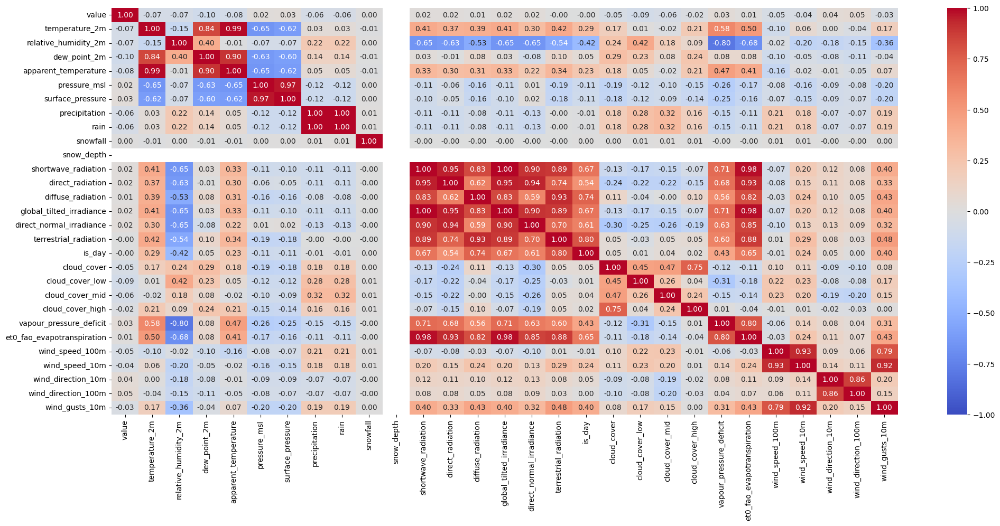

In [17]:
columns_of_interest = [
    "value",
    "temperature_2m",
    "relative_humidity_2m",
    "dew_point_2m",
    "apparent_temperature",
    "pressure_msl",
    "surface_pressure",
    # "weather_code",
    "precipitation",
    "rain",
    "snowfall",
    "snow_depth",
    "shortwave_radiation",
    "direct_radiation",
    "diffuse_radiation",
    "global_tilted_irradiance",
    "direct_normal_irradiance",
    "terrestrial_radiation",
    "is_day",
    "cloud_cover",
    "cloud_cover_low",
    "cloud_cover_mid",
    "cloud_cover_high",
    "vapour_pressure_deficit",
    "et0_fao_evapotranspiration",
    "wind_speed_100m",
    "wind_speed_10m",
    "wind_direction_10m",
    "wind_direction_100m",
    "wind_gusts_10m",
]
corr_df = timeseries_df[columns_of_interest].corr()
print(f"\n\n{'='*sep_length}\nCorrelation Matrix")
display(corr_df)
fig, ax = plt.subplots(figsize=(24, 10))
fig = sns.heatmap(corr_df, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, ax=ax)
plt.show()
plt.close()

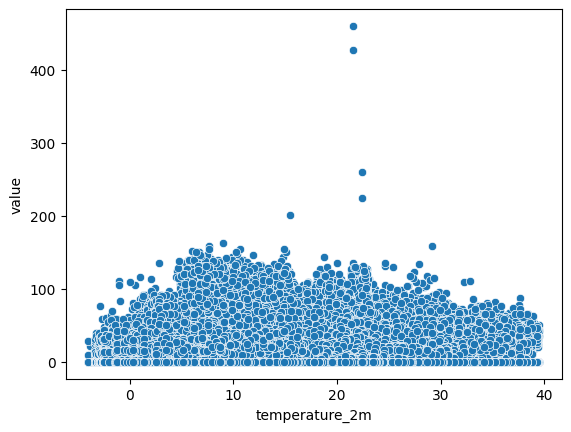

Lag 1 corr: -0.06865724184462553
Lag 2 corr: -0.06882236955471084
Lag 3 corr: -0.06889141735115238
Lag 4 corr: -0.06911034696465627
Lag 5 corr: -0.06927902191771648
Lag 6 corr: -0.06956963671070086


In [18]:
sns.scatterplot(x=timeseries_df['temperature_2m'], y=timeseries_df['value'])
plt.show()

for i in range(1, 7):
    print(f"Lag {i} corr: {timeseries_df['value'].corr(timeseries_df['temperature_2m'].shift(i))}")

['location_id', 'sensor_id', 'name', 'location_name', 'latitude', 'longitude', 'elevation', 'value', 'datetimeTo_utc', 'datetimeTo_local', 'timezone', 'temperature_2m', 'relative_humidity_2m', 'dew_point_2m', 'apparent_temperature', 'pressure_msl', 'surface_pressure', 'weather_code', 'precipitation', 'rain', 'snowfall', 'snow_depth', 'shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'global_tilted_irradiance', 'direct_normal_irradiance', 'terrestrial_radiation', 'is_day', 'cloud_cover', 'cloud_cover_low', 'cloud_cover_mid', 'cloud_cover_high', 'vapour_pressure_deficit', 'et0_fao_evapotranspiration', 'wind_speed_100m', 'wind_speed_10m', 'wind_direction_10m', 'wind_direction_100m', 'wind_gusts_10m']


Analyzing column: temperature_2m
Lag 0 corr: -0.06854295508713956
Lag 1 corr: -0.06865724184462553
Lag 2 corr: -0.06882236955471084
Lag 3 corr: -0.06889141735115238
Lag 4 corr: -0.06911034696465627
Lag 5 corr: -0.06927902191771648
Lag 6 corr: -0.06956963671070086


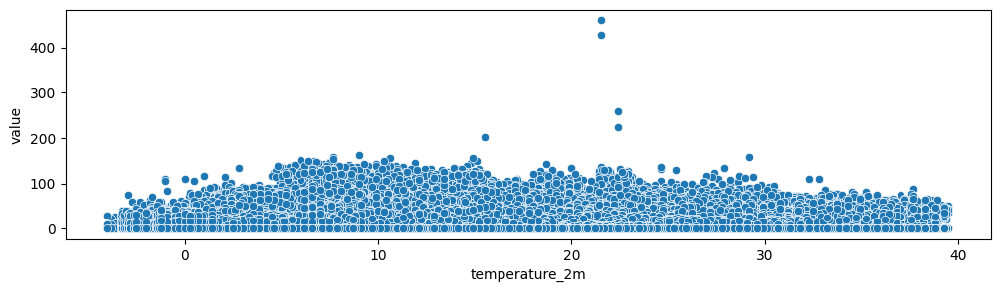



Analyzing column: relative_humidity_2m
Lag 0 corr: -0.07005826110380037
Lag 1 corr: -0.06955171356288879
Lag 2 corr: -0.06907904013179512
Lag 3 corr: -0.06933552593356515
Lag 4 corr: -0.07000139512432367
Lag 5 corr: -0.07082140255271113
Lag 6 corr: -0.07110693974260326


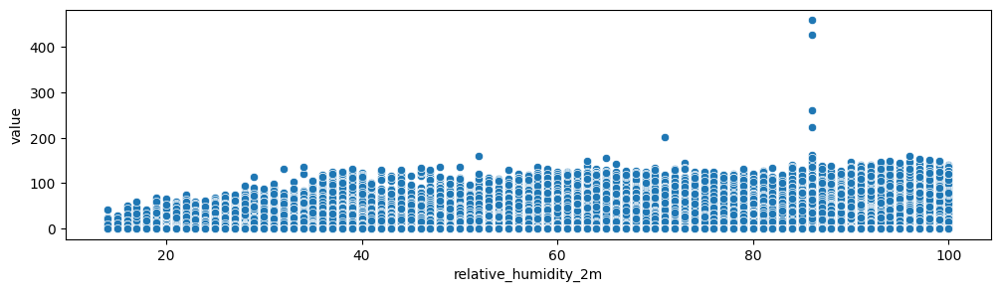



Analyzing column: dew_point_2m
Lag 0 corr: -0.10154516715051108
Lag 1 corr: -0.10153872148046952
Lag 2 corr: -0.10178422444226669
Lag 3 corr: -0.10232121483892218
Lag 4 corr: -0.10316029707808924
Lag 5 corr: -0.10390713609570941
Lag 6 corr: -0.10441244514197993


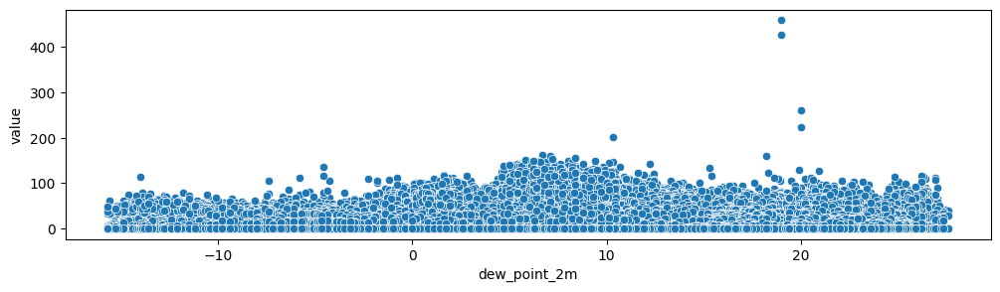



Analyzing column: apparent_temperature
Lag 0 corr: -0.07792145990368805
Lag 1 corr: -0.07786668632600623
Lag 2 corr: -0.07779423070154574
Lag 3 corr: -0.07773104742978716
Lag 4 corr: -0.07791215381611633
Lag 5 corr: -0.07809691884649579
Lag 6 corr: -0.07833824481795253


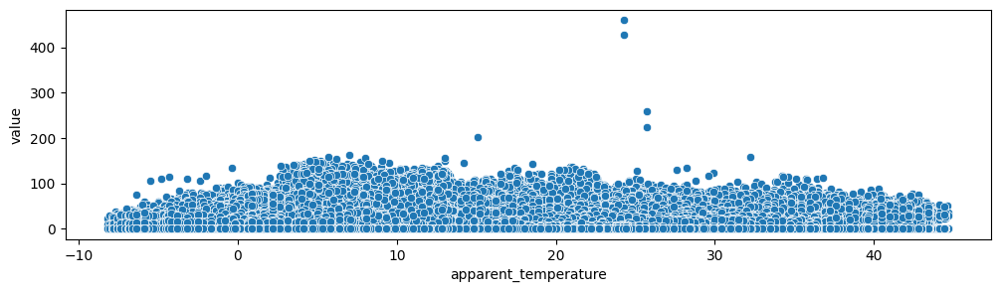



Analyzing column: pressure_msl
Lag 0 corr: 0.02228651688693445
Lag 1 corr: 0.0229896739311722
Lag 2 corr: 0.023473993320832647
Lag 3 corr: 0.023906184675521608
Lag 4 corr: 0.024226059132164763
Lag 5 corr: 0.024563212911084324
Lag 6 corr: 0.02503487999007207


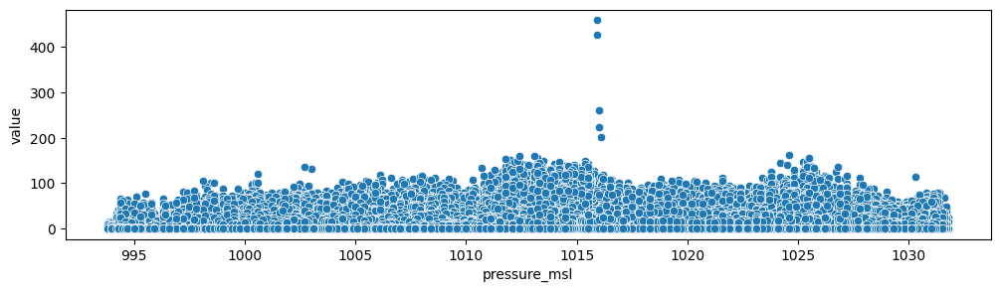



Analyzing column: surface_pressure
Lag 0 corr: 0.025645148950135133
Lag 1 corr: 0.0263297796045057
Lag 2 corr: 0.02680085130735811
Lag 3 corr: 0.027219957614822
Lag 4 corr: 0.02753629596626259
Lag 5 corr: 0.02786265145545997
Lag 6 corr: 0.028321789029508836


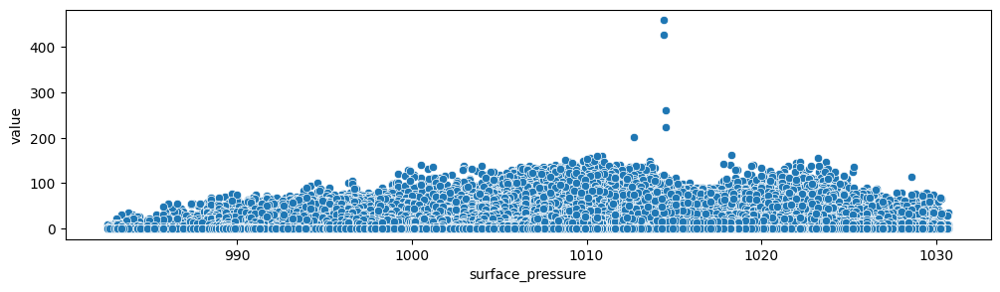



Analyzing column: precipitation
Lag 0 corr: -0.05584511189041149
Lag 1 corr: -0.05937725178487369
Lag 2 corr: -0.06177453482776748
Lag 3 corr: -0.06240653361176369
Lag 4 corr: -0.06265004155529307
Lag 5 corr: -0.06249344043241175
Lag 6 corr: -0.06142446819495329


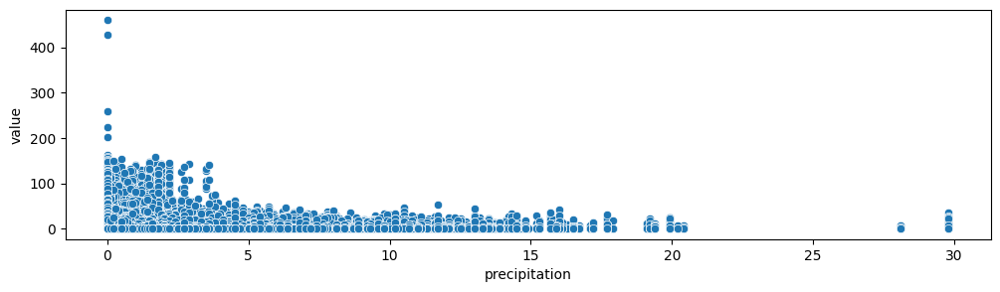



Analyzing column: rain
Lag 0 corr: -0.055849216629679684
Lag 1 corr: -0.059380858031511795
Lag 2 corr: -0.0617772751719355
Lag 3 corr: -0.06240791367593478
Lag 4 corr: -0.0626514098132152
Lag 5 corr: -0.06249661705674059
Lag 6 corr: -0.0614257613185612


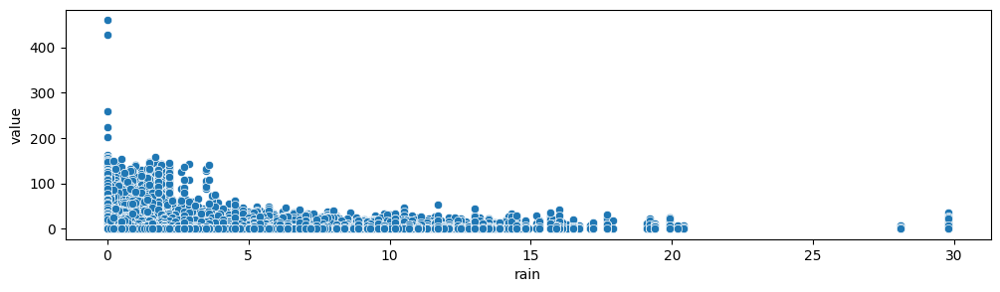



Analyzing column: snowfall
Lag 0 corr: 0.001386323862387536
Lag 1 corr: 0.0010969892601465974
Lag 2 corr: 0.0006514593591049699
Lag 3 corr: -3.1551262677050984e-06
Lag 4 corr: 5.59763826521612e-05
Lag 5 corr: 0.0009354613647052664
Lag 6 corr: 9.616744462414071e-08


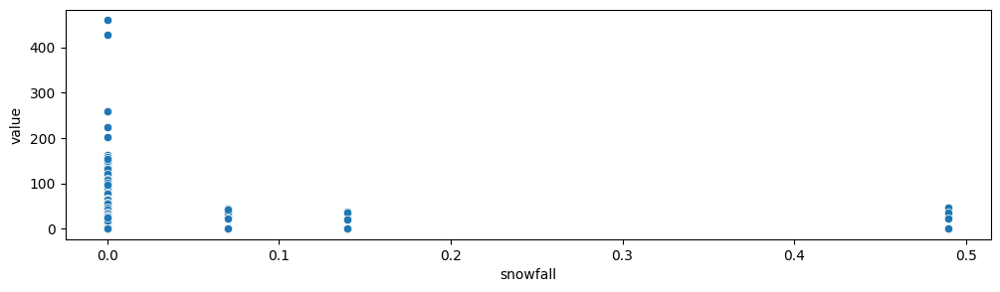



Analyzing column: snow_depth


/home/deniscck/.pyenv/versions/openaq-anomaly-prediction/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/deniscck/.pyenv/versions/openaq-anomaly-prediction/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Lag 0 corr: nan
Lag 1 corr: nan
Lag 2 corr: nan
Lag 3 corr: nan
Lag 4 corr: nan
Lag 5 corr: nan
Lag 6 corr: nan


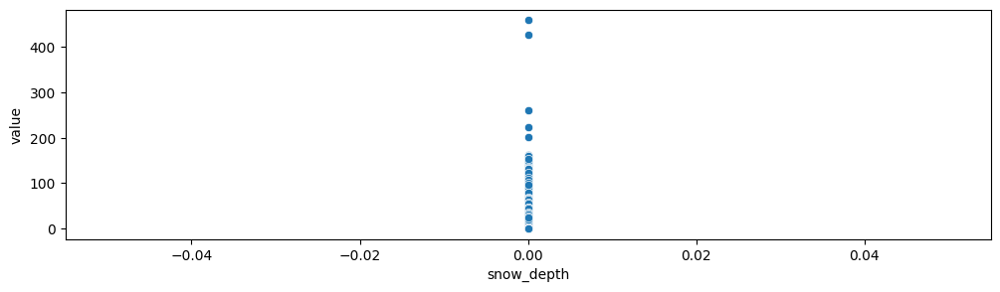



Analyzing column: shortwave_radiation
Lag 0 corr: 0.01703985750016357
Lag 1 corr: 0.01689784391339178
Lag 2 corr: 0.01671289410696466
Lag 3 corr: 0.017087971546576826
Lag 4 corr: 0.01814785461377596
Lag 5 corr: 0.019679502917461365
Lag 6 corr: 0.02142137497755708


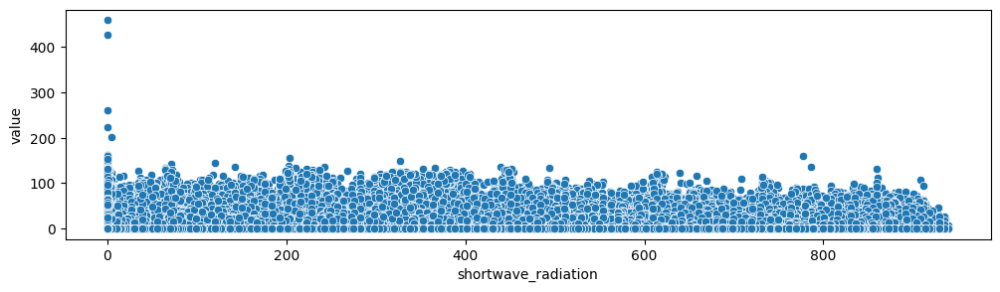



Analyzing column: direct_radiation
Lag 0 corr: 0.019137796533523387
Lag 1 corr: 0.01840730756756351
Lag 2 corr: 0.01775130351080185
Lag 3 corr: 0.017875232391614045
Lag 4 corr: 0.018930237221783493
Lag 5 corr: 0.020502902216033812
Lag 6 corr: 0.022374548333793386


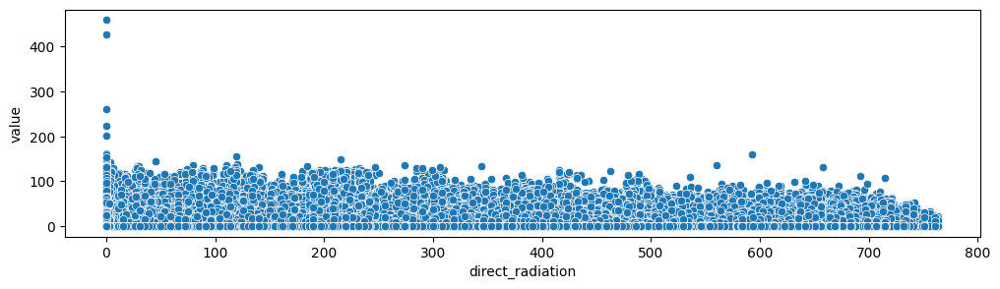



Analyzing column: diffuse_radiation
Lag 0 corr: 0.008846864193043948
Lag 1 corr: 0.009816911504608332
Lag 2 corr: 0.010541555358706765
Lag 3 corr: 0.011278355235406903
Lag 4 corr: 0.012067432815512818
Lag 5 corr: 0.01311352623799739
Lag 6 corr: 0.014164141304269491


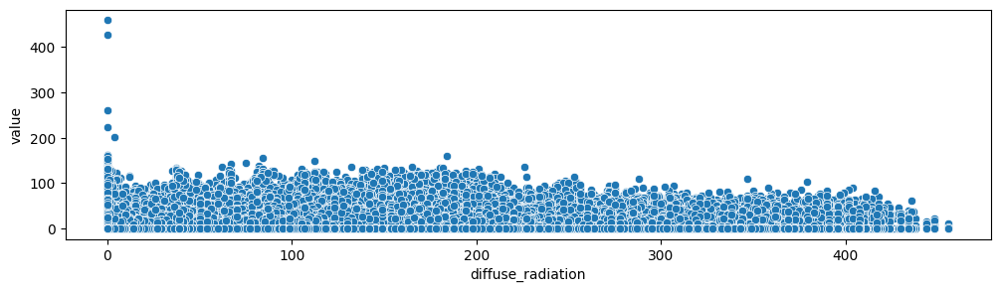



Analyzing column: global_tilted_irradiance
Lag 0 corr: 0.01703985750016357
Lag 1 corr: 0.01689784391339178
Lag 2 corr: 0.01671289410696466
Lag 3 corr: 0.017087971546576826
Lag 4 corr: 0.01814785461377596
Lag 5 corr: 0.019679502917461365
Lag 6 corr: 0.02142137497755708


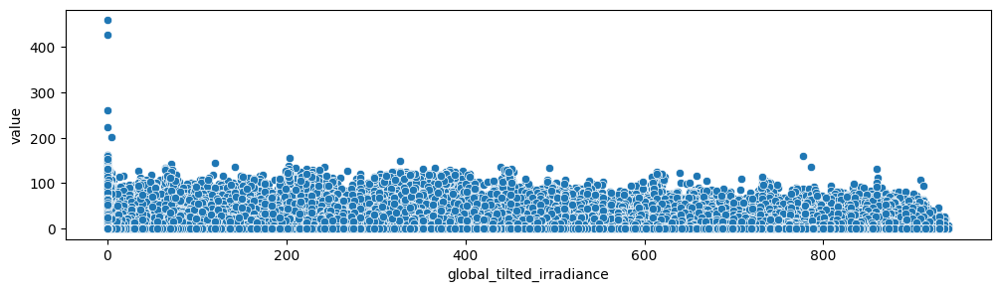



Analyzing column: direct_normal_irradiance
Lag 0 corr: 0.024055602398424403
Lag 1 corr: 0.023794444298315783
Lag 2 corr: 0.0234760604094915
Lag 3 corr: 0.023747556623730442
Lag 4 corr: 0.025105725127611077
Lag 5 corr: 0.027115637480471397
Lag 6 corr: 0.02973144589524752


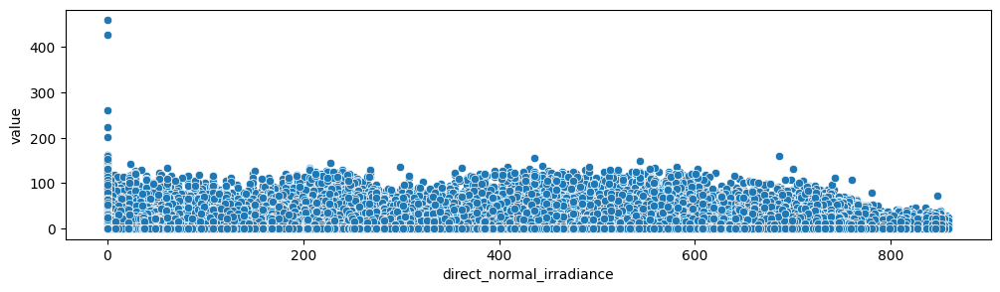



Analyzing column: terrestrial_radiation
Lag 0 corr: -0.0011023228974920707
Lag 1 corr: -0.001278207883525652
Lag 2 corr: -0.0015287782882893353
Lag 3 corr: -0.0013426075610196609
Lag 4 corr: -0.0006425945448041874
Lag 5 corr: 0.000502435605533008
Lag 6 corr: 0.0018646328532654815


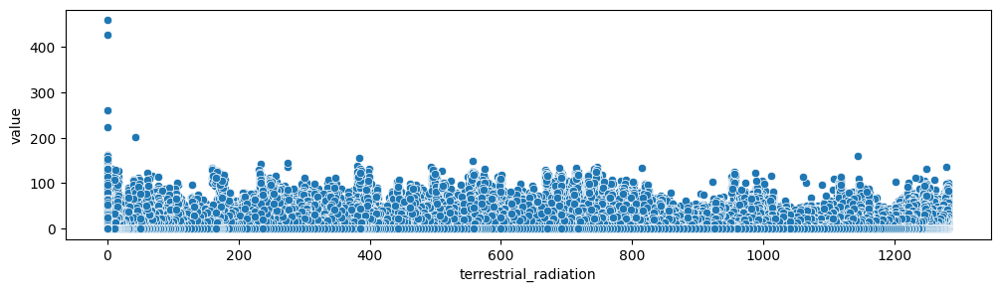



Analyzing column: is_day
Lag 0 corr: -0.003971571741764889
Lag 1 corr: -0.0016552787371236883
Lag 2 corr: 0.0006704745294911421
Lag 3 corr: 0.002602344457995762
Lag 4 corr: 0.0038143620162809314
Lag 5 corr: 0.004481819623686442
Lag 6 corr: 0.005610248366583258


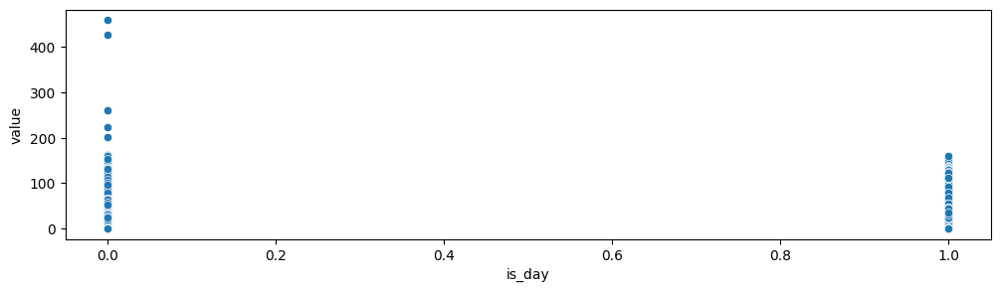



Analyzing column: cloud_cover
Lag 0 corr: -0.048368296922129767
Lag 1 corr: -0.047475831359528625
Lag 2 corr: -0.04648575120265947
Lag 3 corr: -0.045359042864521
Lag 4 corr: -0.044742037536196794
Lag 5 corr: -0.04486946059086438
Lag 6 corr: -0.04510243116952649


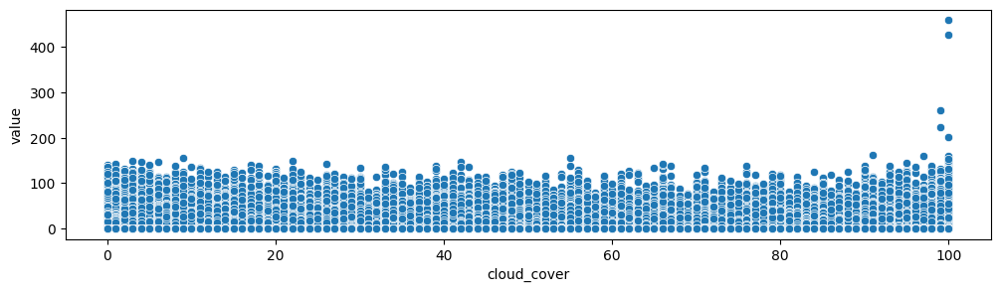



Analyzing column: cloud_cover_low
Lag 0 corr: -0.08541397132014673
Lag 1 corr: -0.08472217114130044
Lag 2 corr: -0.08354751933889659
Lag 3 corr: -0.08167612798772358
Lag 4 corr: -0.07997473026568515
Lag 5 corr: -0.07854104196795492
Lag 6 corr: -0.07703721275564561


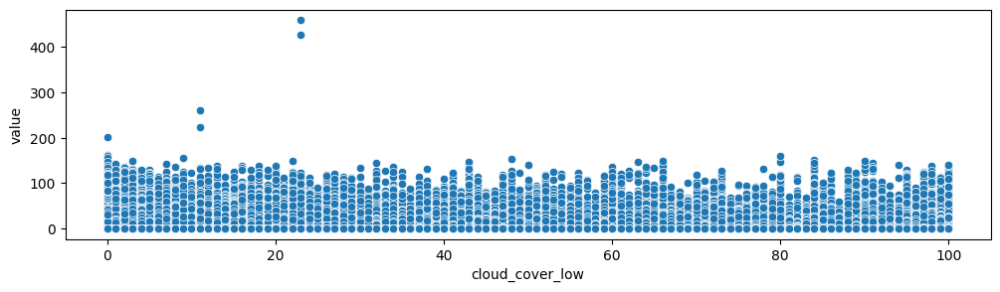



Analyzing column: cloud_cover_mid
Lag 0 corr: -0.05695599980286779
Lag 1 corr: -0.06001569506597023
Lag 2 corr: -0.06257882075980181
Lag 3 corr: -0.06407136643094787
Lag 4 corr: -0.06512375723047106
Lag 5 corr: -0.06626699986079272
Lag 6 corr: -0.067771834138096


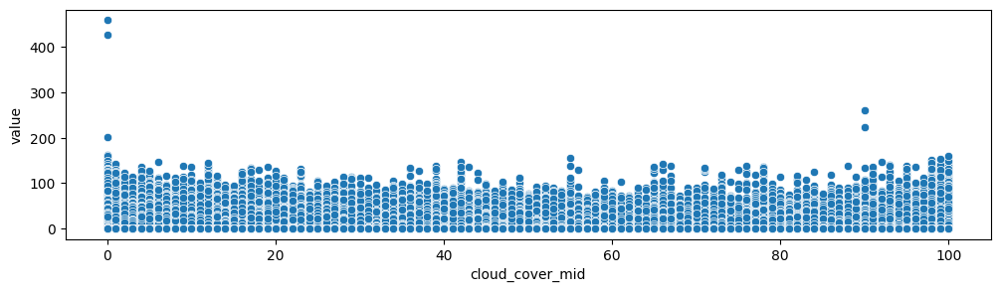



Analyzing column: cloud_cover_high
Lag 0 corr: -0.01664028806642809
Lag 1 corr: -0.01622291703034376
Lag 2 corr: -0.016306898046872128
Lag 3 corr: -0.016559752573823028
Lag 4 corr: -0.017351631201971023
Lag 5 corr: -0.017841151948187976
Lag 6 corr: -0.01823900684403904


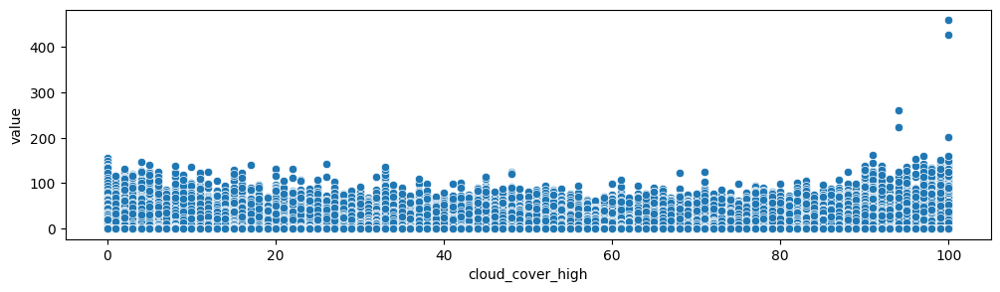



Analyzing column: vapour_pressure_deficit
Lag 0 corr: 0.03316305520768427
Lag 1 corr: 0.03354899676671858
Lag 2 corr: 0.033963169791486794
Lag 3 corr: 0.034485851813990546
Lag 4 corr: 0.034757999992298935
Lag 5 corr: 0.0346827399768846
Lag 6 corr: 0.0339905634486598


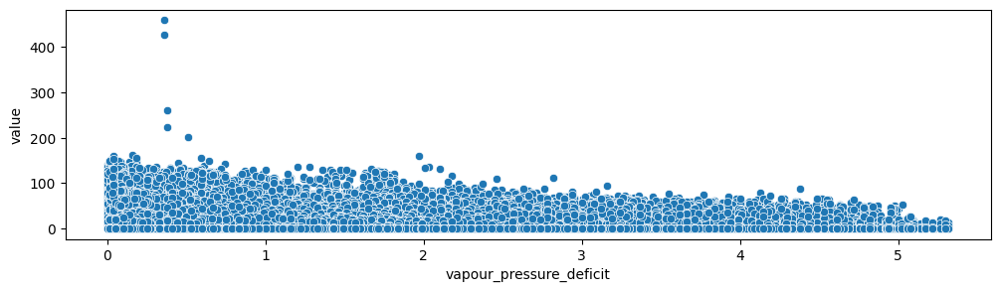



Analyzing column: et0_fao_evapotranspiration
Lag 0 corr: 0.013651778324816096
Lag 1 corr: 0.013409046320815033
Lag 2 corr: 0.01308264292568738
Lag 3 corr: 0.013214156668709157
Lag 4 corr: 0.013747843497047402
Lag 5 corr: 0.014616695628209315
Lag 6 corr: 0.015392502252266063


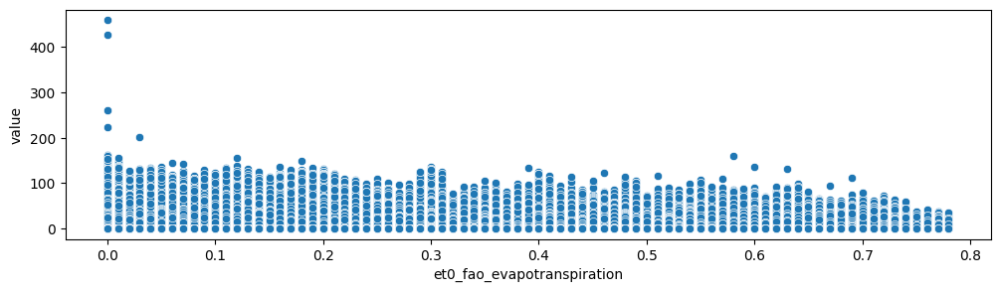



Analyzing column: wind_speed_100m
Lag 0 corr: -0.049407164889662264
Lag 1 corr: -0.05360060705886387
Lag 2 corr: -0.05882379951771632
Lag 3 corr: -0.06328793295058666
Lag 4 corr: -0.06675434767159356
Lag 5 corr: -0.0692663383272026
Lag 6 corr: -0.07132137765404377


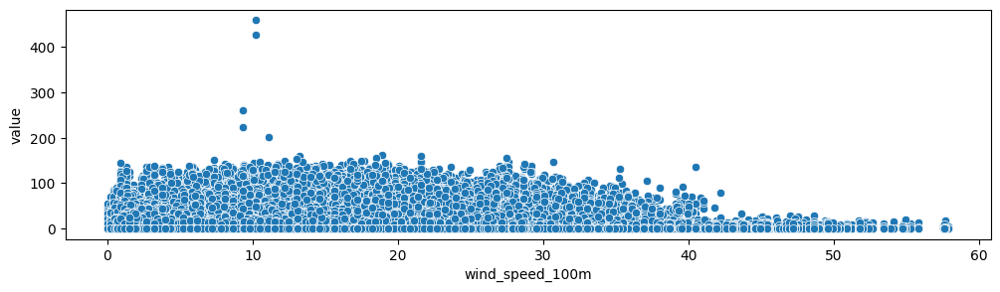



Analyzing column: wind_speed_10m
Lag 0 corr: -0.043433745027998516
Lag 1 corr: -0.04744606648908486
Lag 2 corr: -0.052385936985072615
Lag 3 corr: -0.05649232332367366
Lag 4 corr: -0.05959295468961988
Lag 5 corr: -0.0614801693678236
Lag 6 corr: -0.06274904279912484


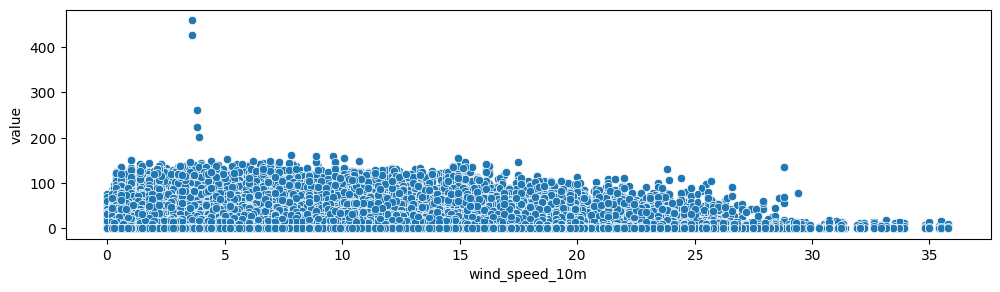



Analyzing column: wind_direction_10m
Lag 0 corr: 0.04040590525581431
Lag 1 corr: 0.042488134756385125
Lag 2 corr: 0.0441538655962742
Lag 3 corr: 0.04563983285983059
Lag 4 corr: 0.04685908156101812
Lag 5 corr: 0.047824850747933724
Lag 6 corr: 0.04843872264140862


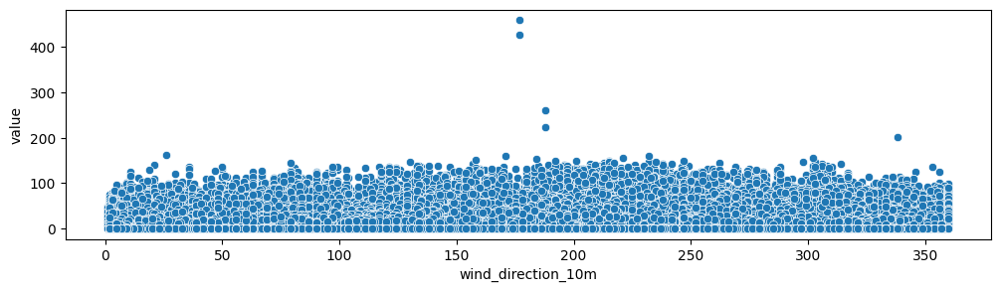



Analyzing column: wind_direction_100m
Lag 0 corr: 0.049032986632045285
Lag 1 corr: 0.051487162234636334
Lag 2 corr: 0.05324436603710137
Lag 3 corr: 0.05479970195513197
Lag 4 corr: 0.05588062592153625
Lag 5 corr: 0.056691105081938545
Lag 6 corr: 0.057327930587226184


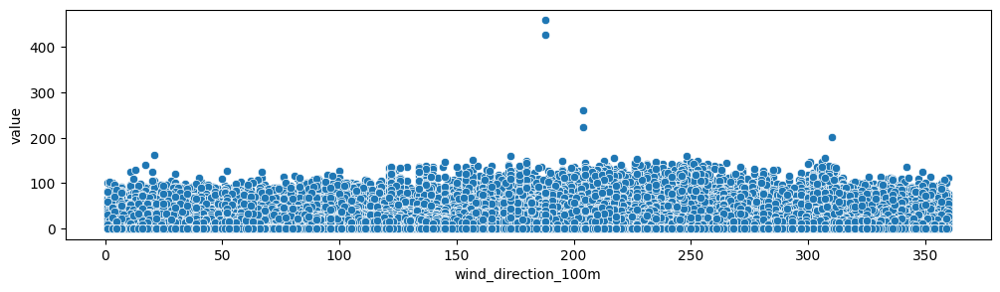



Analyzing column: wind_gusts_10m
Lag 0 corr: -0.03368220278773686
Lag 1 corr: -0.037878265954096074
Lag 2 corr: -0.04234597069525559
Lag 3 corr: -0.04607861680929812
Lag 4 corr: -0.048363410568680855
Lag 5 corr: -0.049721878583800685
Lag 6 corr: -0.0502328069901597


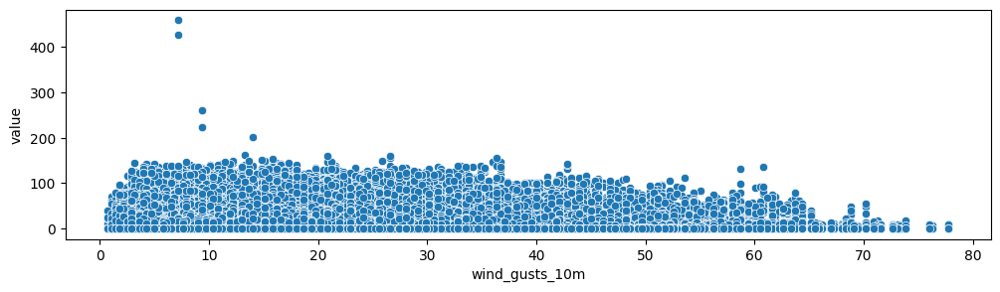

In [19]:
print(timeseries_df.columns.tolist())

columns_of_interest = [
    "temperature_2m",
    "relative_humidity_2m",
    "dew_point_2m",
    "apparent_temperature",
    "pressure_msl",
    "surface_pressure",
    # "weather_code",
    "precipitation",
    "rain",
    "snowfall",
    "snow_depth",
    "shortwave_radiation",
    "direct_radiation",
    "diffuse_radiation",
    "global_tilted_irradiance",
    "direct_normal_irradiance",
    "terrestrial_radiation",
    "is_day",
    "cloud_cover",
    "cloud_cover_low",
    "cloud_cover_mid",
    "cloud_cover_high",
    "vapour_pressure_deficit",
    "et0_fao_evapotranspiration",
    "wind_speed_100m",
    "wind_speed_10m",
    "wind_direction_10m",
    "wind_direction_100m",
    "wind_gusts_10m",
]
for col in columns_of_interest:
    fig, ax = plt.subplots(figsize=(12, 3))
    
    print(f"\n\n{'='*sep_length}\nAnalyzing column: {col}")
    # Scatter plot against value
    sns.scatterplot(x=timeseries_df[col], y=timeseries_df['value'])
    
    for i in range(0, 7):
        print(f"Lag {i} corr: {timeseries_df['value'].corr(timeseries_df[col].shift(i))}")
        
    # fig = sns.scatterplot(data=timeseries_df, x="datetimeTo_local", y=col, ax=ax)
    # plt.title(f"{col} over Time")
    plt.show()
    plt.close()

In [20]:
# Check Outliers and NaN values
print(f"{'='*sep_length}\nFRESH QUERY: various checks\n{'-'*sep_length}")
total_count = len(timeseries_df)
outliers_count = len(timeseries_df[timeseries_df["value"] >= 10000])
print(f"\nOutliers (value == 10000): {outliers_count/total_count:.2%} ({outliers_count}/{total_count})")
print(f"\nNaN values: {timeseries_df['value'].isna().sum()/total_count:.2%} ({timeseries_df['value'].isna().sum()}/{total_count})\n")
cols_to_check = ["location_id", "location_name", "latitude", "longitude", "elevation", "datetimeTo_utc", "datetimeTo_local"]
print(f"Static columns: \n\n{timeseries_df[cols_to_check].count()}\n")

# Check the Bronze View (should both be TIMESTAMP)
print(f"{'-'*int(sep_length/3)*3}\n\nBronze View Schema")
display(con.execute("DESCRIBE SELECT datetimeTo_local FROM bronze_timeseries").df())

# Check the Silver View (the joined one)
print(f"\n\nSilver View Schema")
display(con.execute("DESCRIBE SELECT datetimeTo_local FROM silver_timeseries_grid").df())

# Check the datetimes timezones
print(f"\n\n{'-'*int(sep_length/3)*3}\n\nDataFrame.head() ")
display(timeseries_df[["location_id", "sensor_id", "datetimeTo_utc", "datetimeTo_local"]].head(5))
print()

FRESH QUERY: various checks
----------------------------------------------------------------

Outliers (value == 10000): 0.00% (0/1787328)

NaN values: 3.43% (61249/1787328)

Static columns: 

location_id         1787328
location_name       1787328
latitude            1787328
longitude           1787328
elevation           1787328
datetimeTo_utc      1787328
datetimeTo_local    1787328
dtype: int64

---------------------------------------------------------------

Bronze View Schema


,column_name,column_type,null,key,default,extra
0,datetimeTo_local,TIMESTAMP,YES,None,None,None




Silver View Schema


,column_name,column_type,null,key,default,extra
0,datetimeTo_local,TIMESTAMP,YES,None,None,None




---------------------------------------------------------------

DataFrame.head() 


,location_id,sensor_id,datetimeTo_utc,datetimeTo_local
0,2622586,8541530,2025-04-30 17:00:00+02:00,2025-05-01 00:00:00
1,2622586,8541530,2025-04-30 18:00:00+02:00,2025-05-01 01:00:00
2,2622586,8541530,2025-04-30 19:00:00+02:00,2025-05-01 02:00:00
3,2622586,8541530,2025-04-30 20:00:00+02:00,2025-05-01 03:00:00
4,2622586,8541530,2025-04-30 21:00:00+02:00,2025-05-01 04:00:00


<br>

---
### ***↪***&nbsp;&nbsp;**Maps**

TODO:
- MAPS: Add a number grid over all municipalities to identify them from an attached legend
- CHLOROPLETH MAP: add a municipality column for each location

#### Map functions (customization)

In [21]:
# ================================================================
# CUSTOMIZE COLORAXIES (COLOR SCHEMES) AND COLORBAR (LEGEND)

def customize_colorbar(option: str = "vertical", **kwargs) -> dict:
    if option == "vertical":
        x = kwargs.get("x", 0.90)
        y = kwargs.get("y", 0.80)
        len = kwargs.get("len", 0.3)
        thickness = kwargs.get("thickness", 15)

        return dict(
            # tickmode="array",
            # tickvals=[0, 10, 20, 30, 40, 50, 100],
            # ticktext=["0", "10", "20", "30", "40", "50", "100+"],
            x=x,
            y=y,
            len=len,
            thickness=thickness,
            bgcolor="rgba(255,255,255, 1)",
            bordercolor="white",
            borderwidth=1,
            title=dict(text=""),
            # tickfont=dict(size=12)
        )
    else:
        x = kwargs.get("x", 0.87)
        y = kwargs.get("y", 0.06)
        len = kwargs.get("len", 0.23)
        thickness = kwargs.get("thickness", 10)

        return dict(
            orientation="h",
            x=x,
            y=y,
            len=len,
            thickness=thickness,
            bgcolor="rgba(255,255,255, 1)",
            bordercolor="white",
            title=dict(text=""),
            # tickfont=dict(size=12)
        )

    return fig

def customize_coloraxes(point_coloraxis: list, border_coloraxis: list, **kwargs) -> dict:
    cmin = kwargs.get("cmin", 0)
    cmax = kwargs.get("cmax", None)

    return {
        # Point coloraxis
        "coloraxis": dict(
            colorscale=point_coloraxis,
            cmin=cmin,
            cmax=cmax,
            # colorbar=customize_colorbar(option="vertical")
        ),
        # Border coloraxis
        "coloraxis2": dict(
            colorscale=border_coloraxis,
            cmin=cmin,
            cmax=cmax,
            showscale=False
        )
    }


# ================================================================
# CUSTOMIZE MAP LAYERS (GEOJSON)

def customize_map_layers(city_geojson: dict, seoul_geojson_districts: dict | None = None, option: str = "default", **kwargs) -> list:
    color = kwargs.get("color", "")
    dimmer_color = kwargs.get("dimmer_color", "rgba(0, 0, 0, 0.2)")
    glowing_border = kwargs.get("glowing_border", False)

    border_color = kwargs.get("border_color", "white")
    border_width = kwargs.get("border_width", 2)

    sub_border_color = kwargs.get("sub_border_color", "rgba(0,0,0,0.4)")
    sub_border_width = kwargs.get("sub_border_width", 2)
    sub_dashes = kwargs.get("sub_dashes", [2, 2])

    map_layers = []

    # Create the Mask geojson
    world_coords = [[-180, -90], [180, -90], [180, 90], [-180, 90], [-180, -90]]
    city_coords = city_geojson['features'][0]['geometry']['coordinates']
    mask_geojson = {
        "type": "FeatureCollection",
        "features": [{
            "type": "Feature",
            "geometry": {
                "type": "Polygon",
                "coordinates": [world_coords] + city_coords if isinstance(city_coords[0][0], list) else [world_coords, city_coords[0]]
            },
            "properties": {}
        }]
    }

    if option == "default":
        map_layers = [
            # LAYER 1: The "Dimmer" (Everything EXCEPT Seoul)
            {
                "sourcetype": "geojson",
                "source": mask_geojson,
                "type": "fill",
                "color": f"{dimmer_color}", # Darken the rest of the world
                "below": "traces",
            },
            # LAYER 3: The Thick White Border for Seoul
            # {
            #     "sourcetype": "geojson",
            #     "source": city_geojson,
            #     "type": "line",
            #     "color": "rgba(255, 255, 255, 1)",
            #     "line": {"width": 2},
            #     "below": "traces"
            # },
            # # LAYER 4: Dim Seoul (less)
            # {
            #     "sourcetype": "geojson",
            #     "source": seoul_geojson,
            #     "type": "fill",
            #     "color": "rgba(0, 0, 0, 0.1)", # Darken Seoul
            #     "below": "traces"
            # },
        ]

        # LAYER: The Seoul Municipalities
        if seoul_geojson_districts is not None:
            map_layers.append({
                "sourcetype": "geojson",
                "source": seoul_geojson_districts,
                "type": "line",
                "color": f"{sub_border_color}",
                "line": {
                    "width": sub_border_width,
                    "dash": sub_dashes,  # [dash length, gap length]
                },
                "below": "traces",
            })

        # BORDER: Seoul Borders
        if glowing_border:
            glow_layers = []
            for width, opacity in zip([2, 5, 10, 15], [0.8, 0.4, 0.2, 0.1]):
                glow_layers.append({
                    "sourcetype": "geojson",
                    "source": city_geojson,
                    "type": "line",
                    "color": f"rgba(255, 255, 255, {opacity})",
                    "line": {"width": width},
                    "below": "traces"
                })
            map_layers.extend(glow_layers)
        else:
            map_layers.extend([{
                "sourcetype": "geojson",
                "source": city_geojson,
                "type": "line",
                "color": border_color,
                "line": {"width": border_width},
                "below": "traces"
            }])

    return map_layers


# ================================================================
# CUSTOMIZE POINTS

# TODO: Add an exponential "size" feature for both the size of the points and the colors

def customize_points(fig: PlotlyFigure, df: pd.DataFrame, lat: str, lon: str, **kwargs) -> PlotlyFigure:
    color = kwargs.get("color", None)
    size_column = kwargs.get("size", None)
    size_max = kwargs.get("size_max", 24)
    border = kwargs.get("border", size_column is None)

    hover_name = kwargs.get("hover_name", None)
    hover_data = kwargs.get("hover_data", None)

    exponential = kwargs.get("exponential", False)

    # Reset all traces
    fig.data = []

    border_scaling_ratio = 1.5
    base_point_size = 16

    point_size = base_point_size if size_column is None else 0
    border_size = int(point_size*border_scaling_ratio) if size_column is None else None

    df_plot = df

    # EXPONENTIAL MODE
    if exponential and size_column:
        # Example: Square the values to create exponential visual scaling
        df_plot[size_column + "_exp"] = df_plot[size_column] ** 2
        size_column = size_column + "_exp"
        if hover_data is not None:
            hover_data[size_column] = False

    # FIXED SIZE (settings)
    if size_column is None:
        border_settings = {
            "coloraxis": "coloraxis2",
            "size": border_size if not size_column else None,
            "color": "white",
        }
        marker_settings = {
            "coloraxis": "coloraxis",
            "size": point_size,
        }
    # SCALED SIZE (settings)
    else:
        border_settings = {
            "coloraxis": "coloraxis2",
            # color="white",
            # opacity=0.8,
            # sizemode='area' if size else None,
            # sizeref=calc_sizeref if size else None,
        }
        marker_settings = {
            "coloraxis": "coloraxis",
            "sizemode": "area",
            # sizeref=calc_sizeref if size else None,
            "sizemin": 4
        }

    # BORDER: larger bottom/border layer
    if border:
        border_fig = px.scatter_map(
            df_plot, lat=lat, lon=lon,
            color=color,
            size=size_column,
            size_max=size_max + 8 if size_column is not None else None,
        )
        border_fig.update_traces(marker=border_settings)
        for trace in border_fig.data:
            fig.add_trace(trace)
        # border_trace = px.scatter_map(
        #     df_plot, lat=lat, lon=lon,
        #     color=color,
        #     size=size_column,
        #     size_max=size_max + 8 if size_column is not None else None,
        # ).data[0]
        # border_trace.marker.update(border_settings)
        # fig.add_trace(border_trace)

    # POINT/MARKER: slightly smaller top/fill layer
    fill_fig = px.scatter_map(
        df_plot, lat=lat, lon=lon,
        opacity=1,  # force settings
        color=color,
        size=size_column,
        size_max=size_max,
        hover_name=hover_name,
        hover_data=hover_data,

    )
    fill_fig.update_traces(marker=marker_settings)
    for trace in fill_fig.data:
        fig.add_trace(trace)
    # fill_trace = px.scatter_map(
    #     df_plot, lat=lat, lon=lon,
    #     opacity=1,  # force settings
    #     color=color,
    #     size=size_column,
    #     size_max=size_max,
    #     hover_name=hover_name,
    #     hover_data=hover_data,

    # ).data[0]
    # fill_trace.marker.update(marker_settings)
    # fig.add_trace(fill_trace)

    return fig

# ================================================================
# CUSTOMIZE TITLE

def customize_title(title: str, **kwargs):
    upper = kwargs.get("upper", True)

    if upper:
        title = title.upper()

    return [
        dict(
            text="<b>&nbsp;{}&nbsp;</b>".format(title),
            xref="paper",
            yref="paper",
            x=0.02,
            y=0.98,
            # x=0.,  # Slight padding from the left edge
            # y=1.,  # Slight padding from the top edge
            showarrow=False,
            font=dict(
                size=16,
                color="rgba(255, 255, 255, 0.9)",
                family="Arial"
            ),
            align="left",
            bgcolor="rgba(0, 0, 0, 0.4)", # Optional: subtle background for readability
            borderpad=10,
            bordercolor="rgba(255, 255, 255, 0.9)",
            borderwidth=3,
        )
    ]

#### Map Preload (settings)

In [22]:
# ================================================================
# MAPS PRELOAD (DF + GEOJSON)

# SEOUL City
repo_url = "https://raw.githubusercontent.com/southkorea/southkorea-maps/master/kostat/2018/json/skorea-provinces-2018-geo.json"
seoul_geojson = {
    "type": "FeatureCollection",
    "features": [
        f for f in requests.get(repo_url).json()['features']
        if f['properties'].get('name') == 'Seoul'
        or f['properties'].get('name_en') == 'Seoul'
        or f['properties'].get('name') == '서울특별시'
    ]
}

# SEOUL Municipalities
repo_url = "https://raw.githubusercontent.com/southkorea/seoul-maps/master/kostat/2013/json/seoul_municipalities_geo_simple.json"
repo_url = "https://raw.githubusercontent.com/southkorea/seoul-maps/refs/heads/master/juso/2015/json/seoul_municipalities_geo_simple.json"
seoul_geojson_districts = requests.get(repo_url).json()

# ================================================================
# CHECK HOW MANY NAN VALUES PER LOCATION

# Prep the dataframe with all unique locations
locations = timeseries_df[["location_id", "location_name", "latitude", "longitude"]].drop_duplicates(subset="location_id")
# locations["nan_count"] = locations["nan_count"].fillna(0)

# locations.head()

# Add the NaN values count for each unique location
for location_id in timeseries_df["location_id"].unique().tolist():
    current_df = timeseries_df[timeseries_df["location_id"] == location_id]
    # current_df["value"] = current_df["value"].ffill()

    locations.loc[locations["location_id"] == location_id, "nan_count"] = current_df["value"].isna().sum()
    locations.loc[locations["location_id"] == location_id, "nan_pct"] = current_df["value"].isna().sum()/len(current_df)

    # print(f"[LOCATION_ID]: {location_id} -> Forward filled {current_df["value"].isna().sum()}/{len(current_df)} values")

# IMPORTANT: to display the overlayed points in order on the map
locations = locations.sort_values(by="nan_count", ascending=True)

# print("TOP 10 locations by NaN values:")
# locations.sort_values(by="nan_count", ascending=True).head(10)

In [23]:
# ================================================================
# MAPPING LOCATION_NAME TO MUNICIPALITIES (WIP)

print(f"{seoul_geojson_districts['features'][0]['properties']}\n")

municipalities = [feature['properties'] for feature in seoul_geojson_districts['features']]

# Trying to map the "location_name" from the dataframe to the municipalities "SIG_KOR_NM" from the GeoJSON file
locations["location_municipality"] = None
for municipality in municipalities:
    locations.loc[locations["location_name"] == str(municipality["SIG_KOR_NM"]), str("location_municipality")] = str(municipality["SIG_ENG_NM"])
locations[["location_name", "location_municipality"]].drop_duplicates().isna().sum()
print(f"Mapped municipalities: {locations[["location_name", "location_municipality"]].drop_duplicates()["location_municipality"].isna().sum()}/{locations["location_id"].nunique()} locations")


{'SIG_CD': '11320', 'SIG_KOR_NM': '도봉구', 'SIG_ENG_NM': 'Dobong-gu', 'ESRI_PK': 0, 'SHAPE_AREA': 0.00211, 'SHAPE_LEN': 0.239901}

Mapped municipalities: 37/58 locations


In [24]:
# ================================================================
# MAPS COLOR SCALES

KOREAN_FLAG_CS = [
    # TIER 1: Deep Ink (0% - 25%)
    [0.0,  "rgba(20, 20, 20, 0.1)"],
    [0.25, "rgba(20, 20, 20, 0.2)"],

    # TIER 2: Official Blue (25% - 50%)
    [0.25, "rgba(0, 71, 160, 0.6)"],
    [0.5,  "rgba(0, 71, 160, 0.7)"],

    # TIER 3: Royal Yellow (50% - 75%)
    [0.5,  "rgba(255, 209, 103, 0.8)"],
    [0.75, "rgba(255, 209, 103, 0.8)"],

    # TIER 4: Cinnabar Red (75% - 100%)
    [0.75, "rgba(205, 46, 58, 0.8)"],
    [1.0,  "rgba(205, 46, 58, 0.8)"]
]

KOREAN_FLAG_CS_SWAP = [
    # TIER 1: Deep Ink (0% - 25%)
    [0.0,  "rgba(20, 20, 20, 0.1)"],
    [0.25, "rgba(20, 20, 20, 0.2)"],

    # TIER 3: Royal Yellow (50% - 75%)
    [0.25,  "rgba(255, 209, 103, 0.6)"],
    [0.5, "rgba(255, 209, 103, 0.7)"],

    # TIER 2: Official Blue (25% - 50%)
    [0.5, "rgba(0, 71, 160, 0.8)"],
    [0.75,  "rgba(0, 71, 160, 0.8)"],
    
    # TIER 4: Cinnabar Red (75% - 100%)
    [0.75, "rgba(205, 46, 58, 0.8)"],
    [1.0,  "rgba(205, 46, 58, 0.8)"]
]

KOREAN_FLAG_CS_GOLD = [
    # TIER 1: Deep Ink (0% - 25%)
    [0.0,  "rgba(20, 20, 20, 0.1)"],
    [0.25, "rgba(20, 20, 20, 0.2)"],

    # TIER 2: Official Blue (25% - 50%)
    [0.25, "rgba(0, 71, 160, 0.6)"],
    [0.5,  "rgba(0, 71, 160, 0.7)"],

    # TIER 3: Royal Yellow (50% - 75%)
    [0.5,  "rgba(205, 46, 58, 0.8)"],
    [0.75, "rgba(205, 46, 58, 0.8)"],

    # TIER 4: Cinnabar Red (75% - 100%)
    [0.75, "rgba(255, 209, 103, 0.8)"],
    [1.0,  "rgba(255, 209, 103, 0.8)"]
]

KOREAN_FLAG_LIGHT_CS = [
    # TIER 1: Deep Ink (0% - 25%)
    [0.0,  "rgba(255, 255, 255, 0.4)"],
    [0.25, "rgba(255, 255, 255, 0.5)"],

    # TIER 2: Official Blue (25% - 50%)
    [0.25, "rgba(0, 71, 160, 0.6)"],
    [0.5,  "rgba(0, 71, 160, 0.7)"],

    # TIER 3: Royal Yellow (50% - 75%)
    [0.5,  "rgba(255, 209, 103, 0.8)"],
    [0.75, "rgba(255, 209, 103, 0.8)"],

    # TIER 4: Cinnabar Red (75% - 100%)
    [0.75, "rgba(205, 46, 58, 0.8)"],
    [1.0,  "rgba(205, 46, 58, 0.8)"]
]

WHITE_TRANSPARENT_CS = [
    # TIER 1: Invisible/Low (0% - 20%)
    [0.0, "rgba(255, 255, 255, 0)"],   # Fully transparent
    [0.2, "rgba(255, 255, 255, 0.2)"], # Faint white "ghost" points

    # TIER 2: Cool/Stable (20% - 50%)
    [0.2, "rgba(255, 255, 255, 0.5)"],    # Start Official Blue (50% Opacity)
    [0.5, "rgba(255, 255, 255, 0.6)"],

    # TIER 3: Warning/Center (50% - 80%)
    [0.5, "rgba(255, 255, 255, 0.9)"],  # Start Royal Yellow (90% Opacity)
    [0.8, "rgba(255, 255, 255, 0.9)"],

    # TIER 4: Critical/Peak (80% - 100%)
    [0.8, "rgba(255, 255, 255, 0.9)"],    # Start Cinnabar Red (Fully Opaque)
    [1.0, "rgba(255, 255, 255, 0.9)"]
]

AQI_PALETTE = [
    [0.0, 'rgba(0, 228, 0, 0)'],      # Clean/Zero: Transparent Green
    [0.2, 'rgba(255, 255, 0, 0.4)'],  # Moderate: Translucent Yellow
    [0.5, 'rgba(255, 126, 0, 0.7)'],  # Unhealthy: Orange
    [0.8, 'rgba(255, 0, 0, 0.9)'],    # Very Unhealthy: Red
    [1.0, 'rgba(143, 63, 151, 1)']    # Hazardous: Solid Purple
]

TOXIC_PALETTE = [
    [0.0, 'rgba(0, 255, 255, 0)'],    # Baseline: Transparent Cyan
    [0.3, 'rgba(173, 255, 47, 0.3)'], # Low: Green-Yellow
    [0.6, 'rgba(255, 255, 0, 0.6)'],  # Mid: Bright Yellow
    [1.0, 'rgba(255, 0, 255, 1)']     # Peak: Solid Magenta/Pink
]

THERMAL_PALETTE = [
    [0.0, 'rgba(255, 245, 240, 0)'],  # Start: Transparent White
    [0.2, 'rgba(254, 224, 210, 0.3)'], # Light Peach
    [0.5, 'rgba(252, 146, 114, 0.6)'], # Soft Coral
    [0.8, 'rgba(222, 45, 38, 0.8)'],   # Strong Red
    [1.0, 'rgba(103, 0, 13, 1)']       # Peak: Deep Maroon
]

#### Map Sandbox

In [25]:
# ================================================================
# COLOR MAPS

custom_transparent_viridis = [
    [0.0, "rgba(68, 1, 84, 0.1)"],   # 0% - Deep Purple, 0% Opacity (Transparent)
    [0.2, "rgba(68, 1, 84, 0.3)"], # 10% - Slight hint of color
    [0.3, "rgba(33, 145, 140, 0.6)"], # 50% - Teal, mostly opaque
    [1.0, "rgba(253, 231, 37, 1)"]  # 100% - Bright Yellow, fully opaque
]

# A scale that transitions from the Blue of the flag to the Red
korea_flag_scale = [
    [0.0, "#0F64CD"],   # Official Blue (Yin)
    [0.5, "#FFFFFF"],   # Neutral White
    [1.0, "#CD2E3A"]    # Official Red (Yang)
]

# A sequential-style scale moving through the five elements
obangsaek_scale = [
    [0.0, "#000000"], # Black (Water/North)
    [0.25, "#0F64CD"], # Blue (Wood/East)
    [0.5, "#FFFFFF"],  # White (Metal/West)
    [0.75, "#FFD167"], # Yellow (Earth/Center)
    [1.0, "#CD2E3A"]   # Red (Fire/South)
]

dancheong_palace_scale = [
    [0.0, "rgba(22, 55, 13, 0)"],   # 0% - Forest Green (Deep/Transparent)
    [0.2, "#245B4A"],              # 20% - Jadeite Green
    [0.5, "#8ABFE8"],              # 50% - Sky Blue (Jordy Blue)
    [0.8, "#FFD167"],              # 80% - Royal Yellow
    [1.0, "#CD2E3A"]               # 100% - Cinnabar Red
]

joseon_night_scale = [
    [0.0, "rgba(25, 23, 96, 0)"],   # 0% - Cosmic Cobalt (Transparent)
    [0.3, "#474693"],              # 30% - Evening Blue
    [0.6, "#A3238B"],              # 60% - Royal Purple
    [1.0, "#F2D97A"]               # 100% - Hanji Paper Glow (Warm Yellow)
]

# ================================================================

taegeuk_white_mid_scale = [
    [0.0, "rgba(0, 71, 160, 0)"],   # Transparent Blue
    [0.4, "#0047A0"],              # Solid Blue
    [0.5, "#FFFFFF"],              # Pure White (The Flag Background)
    [0.6, "#CD2E3A"],              # Solid Red
    [1.0, "rgba(205, 46, 58, 1)"]  # Max Red
]

kr_flag_scale_light = [
    [0.0, "rgba(255, 255, 255, 0)"],    # 0% - Official Blue, 0% Opacity (Invisible)
    [0.25, "rgba(255, 255, 255, 0.2)"],  # 10% - Faint Blue shadow
    [0.5, "rgba(0, 71, 160, 0.8)"],  # 50% - Strong Blue (Yin Energy)
    [0.75, "rgba(205, 46, 58, 0.9)"],# 75% - Transitioning to Red
    [1.0, "rgba(205, 46, 58, 1)"]    # 100% - Official Red (Yang Energy/Peak)
]

kr_flag_scale_bold = [
    [0.0, "rgba(255, 255, 255, 0.6)"],    # 0% - Official Blue, 0% Opacity (Invisible)
    [0.25, "rgba(255, 255, 255, 0.7)"],  # 10% - Faint Blue shadow
    [0.5, "rgba(0, 71, 160, 0.8)"],  # 50% - Strong Blue (Yin Energy)
    [0.75, "rgba(205, 46, 58, 0.9)"],# 75% - Transitioning to Red
    [1.0, "rgba(205, 46, 58, 1)"]    # 100% - Official Red (Yang Energy/Peak)
]

kr_flag_scale_stepped = [
    [0.0, "rgba(255, 255, 255, 0.1)"], # Tier 1: Low/Invisible
    [0.3, "rgba(255, 255, 255, 0.4)"],

    [0.3, "#0047A0"],                  # Tier 2: Instant Blue start
    [0.6, "#0047A0"],                  # Solid Blue block

    [0.6, "#CD2E3A"],                  # Tier 3: Instant Red start
    [1.0, "#CD2E3A"]                   # Solid Red peak
]

obangsaek_dramatic = [
    [0.0, "rgba(255, 255, 255, 0.1)"], # Tier 1: Base
    [0.2, "rgba(255, 255, 255, 0.4)"],

    [0.2, "#0047A0"],                  # Tier 2: Blue (Cool)
    [0.5, "#0047A0"],

    [0.5, "#FFD167"],                  # Tier 3: Yellow (Warning)
    [0.8, "#FFD167"],

    [0.8, "#CD2E3A"],                  # Tier 4: Red (Critical)
    [1.0, "#CD2E3A"]
]


seoul_neon_tiers = [
    [0.0, "rgba(25, 23, 96, 0.1)"],   # Dim Navy
    [0.4, "#0047A0"],                 # Solid National Blue
    [0.7, "#00ACDC"],                 # "Energy" Cyan (Bright transition)
    [0.85, "#FFD167"],                # "Gold" Highlight
    [1.0, "#FF0000"]                  # Pure "Emergency" Red
]

obangsaek_dramatic_transparent = [
    # TIER 1: Invisible/Low (0% - 20%)
    [0.0, "rgba(255, 255, 255, 0)"],   # Fully transparent
    [0.2, "rgba(255, 255, 255, 0.2)"], # Faint white "ghost" points

    # TIER 2: Cool/Stable (20% - 50%)
    [0.2, "rgba(0, 71, 160, 0.5)"],    # Start Official Blue (50% Opacity)
    [0.5, "rgba(0, 71, 160, 0.6)"],

    # TIER 3: Warning/Center (50% - 80%)
    [0.5, "rgba(255, 209, 103, 0.9)"],  # Start Royal Yellow (90% Opacity)
    [0.8, "rgba(255, 209, 103, 0.9)"],

    # TIER 4: Critical/Peak (80% - 100%)
    [0.8, "rgba(205, 46, 58, 1.0)"],    # Start Cinnabar Red (Fully Opaque)
    [1.0, "rgba(205, 46, 58, 1.0)"]
]

white_transparent = [
    # TIER 1: Invisible/Low (0% - 20%)
    [0.0, "rgba(255, 255, 255, 0)"],   # Fully transparent
    [0.2, "rgba(255, 255, 255, 0.2)"], # Faint white "ghost" points

    # TIER 2: Cool/Stable (20% - 50%)
    [0.2, "rgba(255, 255, 255, 0.5)"],    # Start Official Blue (50% Opacity)
    [0.5, "rgba(255, 255, 255, 0.6)"],

    # TIER 3: Warning/Center (50% - 80%)
    [0.5, "rgba(255, 255, 255, 0.9)"],  # Start Royal Yellow (90% Opacity)
    [0.8, "rgba(255, 255, 255, 0.9)"],

    # TIER 4: Critical/Peak (80% - 100%)
    [0.8, "rgba(255, 255, 255, 1.0)"],    # Start Cinnabar Red (Fully Opaque)
    [1.0, "rgba(255, 255, 255, 1.0)"]
]

white_glow_scale = [
    # TIER 1: Almost invisible border (matches your ghost points)
    [0.0, "rgba(255, 255, 255, 0.0)"],
    [0.2, "rgba(255, 255, 255, 0.05)"], # Barely there

    # TIER 2: Subtle backing for Blue
    [0.2, "rgba(255, 255, 255, 0.7)"],
    [0.5, "rgba(255, 255, 255, 0.7)"],

    # TIER 3: Strong backing for Yellow
    [0.5, "rgba(255, 255, 255, 0.8)"],
    [0.8, "rgba(255, 255, 255, 0.8)"],

    # TIER 4: High-contrast "Light" for Red
    [0.8, "rgba(255, 255, 255, 0.9)"],
    [1.0, "rgba(255, 255, 255, 1.0)"]   # Pure solid white glow
]


obangsaek_solid_dramatic = [
    # TIER 1: Deep Ink / Shadow (0% - 20%)
    # Using a deep charcoal instead of white; very low opacity
    [0.0, "rgba(20, 20, 20, 0)"],     # Fully invisible
    [0.2, "rgba(20, 20, 20, 0.2)"],   # Subtle "Ink" shadow

    # TIER 2: Official Blue (20% - 50%)
    [0.2, "rgba(0, 71, 160, 0.6)"],   # 60% Opacity to keep it "cool"
    [0.5, "rgba(0, 71, 160, 0.7)"],

    # TIER 3: Royal Yellow (50% - 80%)
    [0.5, "rgba(255, 209, 103, 0.9)"], # 90% Opacity
    [0.8, "rgba(255, 209, 103, 0.9)"],

    # TIER 4: Cinnabar Red (80% - 100%)
    [0.8, "rgba(205, 46, 58, 1.0)"],   # Fully Opaque
    [1.0, "rgba(205, 46, 58, 1.0)"]
]

obangsaek_equal_steps = [
    # TIER 1: Deep Ink (0% - 25%)
    [0.0,  "rgba(20, 20, 20, 0.1)"],
    [0.25, "rgba(20, 20, 20, 0.2)"],

    # TIER 2: Official Blue (25% - 50%)
    [0.25, "rgba(0, 71, 160, 0.6)"],
    [0.5,  "rgba(0, 71, 160, 0.7)"],

    # TIER 3: Royal Yellow (50% - 75%)
    [0.5,  "rgba(255, 209, 103, 0.9)"],
    [0.75, "rgba(255, 209, 103, 0.9)"],

    # TIER 4: Cinnabar Red (75% - 100%)
    [0.75, "rgba(205, 46, 58, 1.0)"],
    [1.0,  "rgba(205, 46, 58, 1.0)"]
]

#### Maps: Scatter/Density/Chloropleth

In [26]:
# ================================================================
# SCATTER MAP

filtered_locations = locations[locations["nan_pct"] > 0.]
# print(len(filtered_locations))

fig = px.scatter_map(filtered_locations, lat="latitude", lon="longitude")

# Customize points
fig = customize_points(
    fig,
    filtered_locations,
    lat="latitude",
    lon="longitude",
    color="nan_count",
    # size="nan_count",
    size_max=96,
    exponential=True,
    hover_name="location_name",
    hover_data={
        "location_id": True,
        # "location_municipality": True,
        "nan_count": True,
        "nan_pct": ":.2%",
        "latitude": False,
        "longitude": False,
    },
)

fig.update_layout(
    width=1024,
    height=760,
    margin={"r":0,"t":0,"l":0,"b":0},
    map_style="basic",  # ['basic', 'carto-darkmatter', 'carto-darkmatter-nolabels', 'carto-positron', 'carto-positron-nolabels', 'carto-voyager', 'carto-voyager-nolabels', 'dark', 'light', 'open-street-map', 'outdoors', 'satellite', 'satellite-streets', 'streets', 'white-bg']
    map_zoom=10.3,
    map_center={"lat": 37.55414276122411, "lon": 126.97022422324727},

    annotations=customize_title("SEOUL - Scatter Map", upper=False),
    **customize_coloraxes(KOREAN_FLAG_CS, WHITE_TRANSPARENT_CS, cmax=filtered_locations["nan_count"].max()),
    # coloraxis_colorbar=customize_colorbar(option="vertical", x=0.91, y=0.82),
    coloraxis_colorbar=customize_colorbar(option="horizontal"),
    map_layers=customize_map_layers(
        seoul_geojson,
        seoul_geojson_districts,
        border_color="rgba(255, 255, 255, 1)", border_width=4,
        sub_border_color="rgba(160, 160, 160, 0.4)", sub_border_width=2, sub_dashes=[3,2],
        dimmer_color="rgba(80, 80, 80, 0.4)", glowing_border=False,
    )
)

In [27]:
# ================================================================
# DENSITY MAP

filtered_locations = locations[locations["nan_pct"] > 0.]
# print(len(filtered_locations))

base_multiplier = 1.5
dynamic_radius = base_multiplier * (2 ** (10.1 / 2)) # Approx 45-60 for Seoul at zoom 10

fig = px.density_map(
    filtered_locations,
    lat="latitude",
    lon="longitude",
    z="nan_count",
    radius=150,
    color_continuous_scale=AQI_PALETTE,
    range_color=[0, filtered_locations["nan_count"].max()],
)
fig.update_traces(below='')
fig.update_layout(
    width=1024,
    height=760,
    margin={"r":0,"t":0,"l":0,"b":0},
    map_style="basic",  # ['basic', 'carto-darkmatter', 'carto-darkmatter-nolabels', 'carto-positron', 'carto-positron-nolabels', 'carto-voyager', 'carto-voyager-nolabels', 'dark', 'light', 'open-street-map', 'outdoors', 'satellite', 'satellite-streets', 'streets', 'white-bg']
    map_zoom=10.3,
    map_center={"lat": 37.55414276122411, "lon": 126.97022422324727},

    annotations=customize_title("SEOUL - Density Map", upper=False),
    # **customize_coloraxes(KOREAN_FLAG_CS, WHITE_TRANSPARENT_CS, cmax=filtered_locations["nan_count"].max()),
    coloraxis_colorbar=customize_colorbar(option="horizontal"),
    map_layers=customize_map_layers(
        seoul_geojson,
        seoul_geojson_districts,
        border_color="rgba(255, 255, 255, 1)", border_width=4,
        sub_border_color="rgba(160, 160, 160, 0.4)", sub_border_width=2, sub_dashes=[3,2],
        dimmer_color="rgba(80, 80, 80, 0.4)", glowing_border=False,
    )
)

In [28]:
# ================================================================
# CHROLOPLETH MAP

filtered_locations = locations[locations["nan_pct"] > 0.]
# print(len(filtered_locations))

# Need to map each location coodinates with a GeoJSON municipality
print(f"{seoul_geojson_districts['features'][0]['properties']}\n")

fig = px.choropleth_map(
    filtered_locations,
    geojson=seoul_geojson_districts,
    locations="location_id",
    featureidkey="SIG_ENG_NM",
    # featureidkey="SIG_CD",
    color="nan_count",
    opacity=0.7,
    # lat="latitude",
    # lon="longitude",
    # z="nan_count",
    # radius=50,
    color_continuous_scale=AQI_PALETTE,
    # range_color=[0, filtered_locations["nan_count"].max()],
)
fig.update_traces(below='')
fig.update_layout(
    width=1024,
    height=760,
    margin={"r":12,"t":12,"l":12,"b":12},
    map_style="basic",  # ['basic', 'carto-darkmatter', 'carto-darkmatter-nolabels', 'carto-positron', 'carto-positron-nolabels', 'carto-voyager', 'carto-voyager-nolabels', 'dark', 'light', 'open-street-map', 'outdoors', 'satellite', 'satellite-streets', 'streets', 'white-bg']
    map_zoom=10.3,
    map_center={"lat": 37.55414276122411, "lon": 126.97022422324727},

    annotations=customize_title("SEOUL - Chloropleth Map", upper=False),
    # **customize_coloraxes(KOREAN_FLAG_CS, WHITE_TRANSPARENT_CS, cmax=filtered_locations["nan_count"].max()),
    coloraxis_colorbar=customize_colorbar(option="horizontal"),
    map_layers=customize_map_layers(
        seoul_geojson,
        seoul_geojson_districts,
        border_color="rgba(255, 255, 255, 1)", border_width=4,
        sub_border_color="rgba(160, 160, 160, 0.4)", sub_border_width=2, sub_dashes=[3,2],
        dimmer_color="rgba(80, 80, 80, 0.4)", glowing_border=False,
    )
)

{'SIG_CD': '11320', 'SIG_KOR_NM': '도봉구', 'SIG_ENG_NM': 'Dobong-gu', 'ESRI_PK': 0, 'SHAPE_AREA': 0.00211, 'SHAPE_LEN': 0.239901}



<br>

---
### ***↪***&nbsp;&nbsp;**Preprocessing**

#### Interpolation and filters (functions)

In [ ]:
# ================================================================
# PREPARATION FUNCTIONS

from statsforecast import StatsForecast
# from utilsforecast.preprocessing import fill_gaps


# ----------------------------------------------------------------
# FILL_GAPS: there should never be gaps because we're using the Weather API
# DONE IN DUCKDB/BIGQUERY NOW
# ffilled_df = fill_gaps(
#     ffilled_df,
#     freq='h',
#     id_col='location_id',
#     time_col='datetimeTo_local'
# )


# ----------------------------------------------------------------
# FILL STATIC COLUMNS: fill the static columns specific to each unique location_id
# DONE IN DUCKDB/BIGQUERY NOW
# static_cols = ['location_name', 'latitude', 'longitude', 'elevation']
# ffilled_df[static_cols] = ffilled_df.groupby('location_id')[static_cols].ffill().bfill()


# ----------------------------------------------------------------
# INTERPOLATE: NaN in "value" column (ony +3h to avoid hallucinations)

def interpolate_target(df: pd.DataFrame, **kwargs) -> pd.DataFrame:
    debug = kwargs.get("debug", False)
    sep_length = kwargs.get("sep_length", 64)
    
    target_col = kwargs.get("target_col","value")
    id_col = kwargs.get("id_col","location_id")
    
    linear = kwargs.get("linear", True)
    
    limit = kwargs.get("limit", 6)
    limit_debug_string = "all missing values" if limit is None else f"up to {limit} hours"

    if debug:
        print(f"{'='*sep_length}\nINTERPOLATING DATAFRAME ({id_col}/{target_col})\n{'-'*sep_length}")
        print(f"\nBEFORE INTERPOLATION: {df[target_col].isna().sum().sum()} NaN values ({target_col})\n{'-'*int(sep_length/3)*0}")

    # Add a feature to know if the row's target was imputed or not
    df["is_imputed"] = df[target_col].isna().astype(int)

    # First we forward fill, then we backward fill for the rows without leading value to ffill
    if linear:
        df[target_col] = df.groupby(id_col)[target_col].transform(
            lambda x: x.interpolate(method='linear', limit=limit, limit_direction='both')
            .ffill(limit=limit).bfill(limit=limit))
    else:
        df[target_col] = df.groupby(id_col)[target_col].transform(lambda x: x.ffill(limit=limit).bfill(limit=limit))

    if debug:
        print(f"    -> Adding column: is_imputed")
        if linear:
            print(f"    -> Linear interpolation : {limit_debug_string}")
        print(f"    -> Forward fill         : {limit_debug_string}")
        print(f"    -> Backward fill        : {limit_debug_string}")
        print(f"{'-'*int(sep_length/3)*0}\nAFTER INTERPOLATION : {df[target_col].isna().sum().sum()} NaN values ({target_col})")

    return df


# ----------------------------------------------------------------
# FILTER: the rows after interpolation (nan threshold and data range)

def filter_rows(df: pd.DataFrame, **kwargs) -> pd.DataFrame:
    """Filter all rows according to user-defined filters (NaN threshold, date range)."""
    debug = kwargs.get("debug", False)
    sep_length = kwargs.get("sep_length", 64)

    nan_threshold = kwargs.get("nan_threshold", 0.05)

    show_nixtla = kwargs.get("show_nixtla", False)
    show_matplotlib = kwargs.get("show_matplotlib", False)

    # Location_IDs mask
    selected_location_ids = kwargs.get("selected_location_ids", df["location_id"].unique().tolist())

    # Date mask
    min_date = kwargs.get("min_date", None)
    max_date = kwargs.get("max_date", None)
    min_date_mask = df["datetimeTo_local"] >= min_date if min_date is not None else pd.Series([True]*len(df))
    max_date_mask = df["datetimeTo_local"] <= max_date if max_date is not None else pd.Series([True]*len(df))
    date_mask = min_date_mask & max_date_mask
    # # Print the values
    # display(subset_to_plot[["ds", "y"]].head(20))

    # Nixtla
    if show_nixtla:
        plot_df = df.loc[date_mask].copy()
        plot_df = plot_df.rename(columns={
            "location_id": "unique_id",
            "datetimeTo_local": "ds",
            "value": "y"
        })
        subset_to_plot = plot_df[plot_df["unique_id"].isin(selected_location_ids)]
        fig = StatsForecast.plot(subset_to_plot, engine='plotly')
        fig.show()


    full_locations = []
    partial_locations = []
    dropped_locations = []

    start_date = None
    end_date = None
    max_length_location = max(len(str(location_id)) for location_id in selected_location_ids)
    for i, location_id in enumerate(selected_location_ids):
        location_mask = df["location_id"] == location_id
        current_df = df.loc[date_mask & location_mask].copy()

        if current_df.empty:
            continue
        
        # For debugging
        if start_date is None or current_df["datetimeTo_local"].min() < start_date:
            start_date = current_df["datetimeTo_local"].min()
        if end_date is None or current_df["datetimeTo_local"].max() > end_date:
            end_date = current_df["datetimeTo_local"].max()

        # Count NaN
        nan_pct = current_df["value"].isna().sum()/len(current_df)

        if nan_pct == 0:
            full_locations.append(location_id)
        elif nan_pct < nan_threshold:
            partial_locations.append(location_id)
        else:
            dropped_locations.append(location_id)

        if nan_pct > nan_threshold:
            # Print
            max_length_nan_count = len(str(len(current_df)))
            nan_count_str = f"{current_df["value"].isna().sum():>{max_length_nan_count}} / {len(current_df)}"

            if debug:
                print(f"[LOCATION_ID={location_id:>{max_length_location}}]: {nan_pct:>7.2%} -> {nan_count_str}")

        if nan_pct > nan_threshold and show_matplotlib:
            fig, ax = plt.subplots(figsize=(24, 6))

            # MATPLOTLIB: if we want to see the gaps
            ax.plot(current_df["datetimeTo_local"], current_df["value"], linewidth=1.5)
            ax.set_title(f"Location ID: {location_id} ({current_df["name"].unique().tolist()[0]})")
            ax.set_xlabel("Datetime (hourly)")
            ax.set_ylabel("Value")
            plt.show()
            plt.close(fig)
            print()

        # break  # debug

    if debug:
        print(f"\n{'='*sep_length}\nFILTERING DATAFRAME\n{'-'*sep_length}\n")
        print("[FILTER]: by date range")
        print(f"  From: {start_date}")
        print(f"  To  : {end_date}\n")
        print(f"[FILTER]: by NaN threshold ({nan_threshold:.2%})")
        print(f"  Full locations   : {len(full_locations)}/{len(selected_location_ids)}")
        print(f"  Partial locations: {len(partial_locations)}/{len(selected_location_ids)}")
        print(f"  Dropped locations: {len(dropped_locations)}/{len(selected_location_ids)}\n")

    return df.loc[date_mask & df["location_id"].isin(full_locations+partial_locations) & df["location_id"].isin(selected_location_ids)]

#### Sanitization (interpolation + filters)

In [ ]:
# ================================================================
# DATA SANITIZATION

POLLUTANT = "pm25 µg/m³"
# "pollutants": ["pm25 µg/m³", "co ppm", "o3 ppm", "pm10 µg/m³", "so2 ppm", "no2 ppm"],

sanitized_df = timeseries_df.loc[timeseries_df["name"] == POLLUTANT].copy()
# display(sanitized_df.head())
# sanitized_df = timeseries_df.copy()

selected_location_ids = [2622858, 2623069, 2622627, 2623444]
selected_location_ids = [2623344]

min_date = "2025-09-01"
max_date = "2025-12-31"

# min_date = None
# max_date = None

INTERPOLATION_LIMIT = 72
NAN_THRESHOLD = 0.05

# ----------------------------------------------------------------
# INTERPOLATE TARGET: value/y
sanitized_df = interpolate_target(
    sanitized_df,
    linear=True,
    limit=INTERPOLATION_LIMIT,
    debug=True,
)

# ----------------------------------------------------------------
# FILTER ROWS: NaN threshold and date range
sanitized_df = filter_rows(
    sanitized_df,
    nan_threshold=NAN_THRESHOLD,
    # selected_location_ids=selected_location_ids,
    min_date=min_date,
    max_date=max_date,
    debug=True,
    # show_nixtla=True,
    # show_matplotlib=True
)

# total_count = len(sanitized_df)
# outliers_count = len(sanitized_df[sanitized_df["value"] >= 10000])
# print(f"{'='*sep_length}\nINTERPOLATED AND FILTERED DATAFRAME\n{'-'*sep_length}")
# print(f"\nOutliers (value == 10000): {outliers_count/total_count:.2%} ({outliers_count}/{total_count})")
# print(f"\nNaN values: {sanitized_df['value'].isna().sum()/total_count:.2%} ({sanitized_df['value'].isna().sum()}/{total_count})\n")

# ------------------------------------------------------------------------------
# FINAL CLEANUP BEFORE MODELING
sanitized_df = (
    sanitized_df
    .rename(columns=lambda x: x.strip())
    .drop(columns=[c for c in ["name", "location_name", "timezone"] if c in sanitized_df.columns])
    .rename(columns={
        "datetimeTo_utc": "ds",
        "value": "y",
        "location_id": "unique_id"
    })
    .assign(
        # ds=lambda x: pd.to_datetime(x["ds"]), # doesn't hurt
        unique_id=lambda x: x["unique_id"].astype(str) # StatsForecast best practice for IDs
    )
)

# # ------------------------------------------------------------------------------
# # DROP UNUSED COLUMNS
# to_drop = ["name", "location_name", "timezone"]
# existing_drop = [c for c in to_drop if c in sanitized_df.columns]
# sanitized_df = sanitized_df.drop(columns=existing_drop)

# # ------------------------------------------------------------------------------
# # RENAME COLUMNS
# sanitized_df = sanitized_df.rename(columns={
#     "datetimeTo_utc": "ds",
#     "value": "y",
#     "location_id": "unique_id"
# })

print_summary_timeseries(sanitized_df, title="Ready for preprocessing")

total_count = len(sanitized_df)
outliers_count = len(sanitized_df[sanitized_df["y"] >= 10000])
print(f"Outliers (y == 10000): {outliers_count/total_count:.2%} ({outliers_count}/{total_count})")
print(f"NaN values: {sanitized_df['y'].isna().sum()/total_count:.2%} ({sanitized_df['y'].isna().sum()}/{total_count})\n")

# display(sanitized_df.head())


INTERPOLATING DATAFRAME (location_id/value)
----------------------------------------------------------------

BEFORE INTERPOLATION: 18291 NaN values (value)

    -> Adding column: is_imputed
    -> Linear interpolation : up to 72 hours
    -> Forward fill         : up to 72 hours
    -> Backward fill        : up to 72 hours

AFTER INTERPOLATION : 0 NaN values (value)

FILTERING DATAFRAME
----------------------------------------------------------------

[FILTER]: by date range
  From: 2025-09-01 00:00:00
  To  : 2025-11-30 23:00:00

[FILTER]: by NaN threshold (5.00%)
  Full locations   : 58/58
  Partial locations: 0/58
  Dropped locations: 0/58

SUMMARY: Ready for preprocessing
----------------------------------------------------------------
Total rows  : 126672
Memory usage: 44.58 MB
From: 2025-09-01 00:00:00 (datetimeTo_local)
To  : 2025-11-30 23:00:00 (datetimeTo_local)
------------------------------------------
Unique locations: 58
Outliers (y == 10000): 0.00% (0/126672)
NaN values:

In [ ]:
sanitized_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 126672 entries, 23496 to 1782191
Data columns (total 38 columns):
 #   Column                      Non-Null Count   Dtype                       
---  ------                      --------------   -----                       
 0   unique_id                   126672 non-null  object                      
 1   sensor_id                   126672 non-null  int64                       
 2   latitude                    126672 non-null  float64                     
 3   longitude                   126672 non-null  float64                     
 4   elevation                   126672 non-null  float64                     
 5   y                           126672 non-null  float64                     
 6   ds                          126672 non-null  datetime64[us, Europe/Paris]
 7   datetimeTo_local            126672 non-null  datetime64[us]              
 8   temperature_2m              126266 non-null  float64                     
 9   relative_humidi

#### Preprocessing (SKLearn)

In [ ]:
# StatsForecast.plot(sanitized_df)

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer


selected_location_ids = [2622858, 2623069, 2622627, 2623444]


# ================================================================
# Create Y and X dataframes (target and exogenous features)

Y_columns = ["unique_id", "ds", "y"]


X_features = ["temperature_2m", "relative_humidity_2m", "is_day"]
# X_features = [c for c in sanitized_df.columns if c not in Y_columns + ["sensor_id", "is_imputed"]]
X_columns = ["unique_id", "ds"] + X_features

Y_df = sanitized_df[Y_columns].copy()
X_df = sanitized_df[X_columns].copy()
print(f"Y_df NaN values:\n{Y_df.isna().sum()}\n")
print(f"X_df NaN values:\n{X_df.isna().sum()}\n")

# ================================================================
# Split into train and test sets (last TEST_HORIZON days)

TEST_HORIZON = 24 * 7  # hours
all_dates = sorted(sanitized_df['ds'].unique())
train_dates = all_dates[:-TEST_HORIZON]
test_dates = all_dates[-TEST_HORIZON:]

Y_train = Y_df.query("ds in @train_dates")
Y_test = Y_df.query("ds in @test_dates")

X_train = X_df.query("ds in @train_dates")
X_test = X_df.query("ds in @test_dates")

# Create train dataframe
train_df = Y_train.merge(X_train, how="left", on=["unique_id", "ds"])
print(f"Train period: {train_df['ds'].min()} -> {train_df['ds'].max()}")
display(train_df.head())

print(f"\nTest period: {X_test['ds'].min()} -> {X_test['ds'].max()}")
display(X_test.head())


# # ================================================================
# # Split into train and test sets (last TEST_HORIZON days)

# num_columns = X_df.select_dtypes(include=['number']).columns.tolist()
# print(f"Numerical columns: {num_columns}")

# cat_columns = X_df.select_dtypes(include=['object', 'category']).columns.tolist()
# # cat_columns.remove("unique_id")
# print(f"Categorical columns: {cat_columns}")



Y_df NaN values:
unique_id    0
ds           0
y            0
dtype: int64

X_df NaN values:
unique_id                 0
ds                        0
temperature_2m          406
relative_humidity_2m    406
is_day                  406
dtype: int64

Train period: 2025-08-31 17:00:00+02:00 -> 2025-11-23 15:00:00+01:00


,unique_id,ds,y,temperature_2m,relative_humidity_2m,is_day
0,2622586,2025-08-31 17:00:00+02:00,12.0,25.4,90,0
1,2622586,2025-08-31 18:00:00+02:00,8.0,25.0,93,0
2,2622586,2025-08-31 19:00:00+02:00,6.0,23.9,98,0
3,2622586,2025-08-31 20:00:00+02:00,8.0,23.8,97,0
4,2622586,2025-08-31 21:00:00+02:00,3.0,23.8,96,0



Test period: 2025-11-23 16:00:00+01:00 -> 2025-11-30 15:00:00+01:00


,unique_id,ds,temperature_2m,relative_humidity_2m,is_day
25512,2622586,2025-11-23 16:00:00+01:00,10.3,81,0
25513,2622586,2025-11-23 17:00:00+01:00,10.0,82,0
25514,2622586,2025-11-23 18:00:00+01:00,9.9,84,0
25515,2622586,2025-11-23 19:00:00+01:00,9.0,86,0
25516,2622586,2025-11-23 20:00:00+01:00,9.3,85,0


In [ ]:
fig = px.line(
    train_df[train_df["unique_id"] == "2622586"],
    x="ds",
    y="y",
    title=f"Time Series for Location ID: {"2622586"}",
)
fig.show()
plt.close(fig)

TypeError: close() argument must be a Figure, an int, a string, or None, not <class 'plotly.graph_objs._figure.Figure'>

In [ ]:
# ================================================================
# PREPROCESSING PIPELINE

num_pipeline = Pipeline(steps=[
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline(steps=[
    ('onehot', OneHotEncoder(sparse_output=True, handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_pipeline, num_columns),
        ('cat', cat_pipeline, cat_columns)
    ]
)

<br>

---
### ***↪***&nbsp;&nbsp;**Time Series**

In [600]:
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA, AutoETS, AutoTheta, AutoCES, MSTL, AutoMFLES
from statsforecast.models import Naive, SeasonalNaive, RandomWalkWithDrift

In [601]:
cpu_cores = os.cpu_count()

In [639]:
# # ================================================================
# # TRAIN/TEST SPLIT

# cleaned_df = cleaned_df.sort_values(by=["ds", "unique_id"])
# # cleaned_df["y"] = np.log1p(cleaned_df["y"])

# start_date = "2025-09-01"
# cutoff_date = "2025-11-15"

# train_df = cleaned_df[(cleaned_df["ds"] >= start_date) & (cleaned_df["ds"] < cutoff_date)]
# print_summary_timeseries(train_df)

# test_df = cleaned_df[cleaned_df["ds"] >= cutoff_date]
# print_summary_timeseries(test_df)

### AutoARIMA

#### Select random locations

In [640]:
random_locations = np.random.choice(train_df['unique_id'].unique(), size=8, replace=False)
print(random_locations)

# train_df.loc[train_df["unique_id"].isin(random_locations)].head()

['2622675' '2622851' '2623718' '2623532' '2623344' '2623440' '2623681'
 '2623069']


In [642]:
# ================================================================
# ADF SCORE: hypothesis testing for stationarity

# The critical values are the ADF thresholds for different confidence levels (1%, 5%, 10%)
# We want the ADF Statistic to be less than the critical value at 5% to reject the null hypothesis
# We want a p-value < 0.05 to reject the null hypothesis (the series is non-stationary)

# We need to check each unique_id separately for ADF test to determine whether each serie is stable or unstable
# As a result, we might want to group together the stable and unstable series for different modeling approaches

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

print(f"\n=== ADF TEST: all locations ===")

for uid in random_locations:
    subset_df = train_df[train_df["unique_id"] == uid]
    result = adfuller(subset_df['y'])
    adf_stat = result[0]
    p_value = result[1]
    crit_values = result[4]
    
    if adf_stat < crit_values['5%'] and p_value < 0.05:
        if adf_stat < crit_values['1%']:
            significance = " 1% "
        elif adf_stat < crit_values['5%']:
            significance = " 5% "
        else:
            significance = "NULL"
        print(f"[{uid}] -> [{significance}] The time series is STATIONARY (reject H0): ADF Stat = {adf_stat}, p-value = {p_value}, Critical Value (5%) = {crit_values['5%']}")
    else:
        print(f"[{uid}] -> [{significance}] The time series is NON-STATIONARY (fail to reject H0): ADF Stat = {adf_stat}, p-value = {p_value}, Critical Value (5%) = {crit_values['5%']}")
    
    # fig, ax = plt.subplots(2, 1, figsize=(10, 8))
    # plot_acf(subset_df['y'], lags=168, ax=ax[0])
    # plot_pacf(subset_df['y'], lags=168, ax=ax[1])
    # plt.show()
    # plt.close(fig)



=== ADF TEST: all locations ===
[2622675] -> [ 1% ] The time series is STATIONARY (reject H0): ADF Stat = -4.69472578587014, p-value = 8.60936902062891e-05, Critical Value (5%) = -2.8629804474582348
[2622851] -> [ 1% ] The time series is STATIONARY (reject H0): ADF Stat = -4.64155477685172, p-value = 0.00010820814876851, Critical Value (5%) = -2.862994217611322
[2623718] -> [ 1% ] The time series is STATIONARY (reject H0): ADF Stat = -4.803577159843484, p-value = 5.3535449632115437e-05, Critical Value (5%) = -2.862994217611322
[2623532] -> [ 1% ] The time series is STATIONARY (reject H0): ADF Stat = -4.220359047789429, p-value = 0.0006085208410204732, Critical Value (5%) = -2.862994217611322
[2623344] -> [ 1% ] The time series is STATIONARY (reject H0): ADF Stat = -3.847104835210404, p-value = 0.002460515919163263, Critical Value (5%) = -2.8629927557359443
[2623440] -> [ 1% ] The time series is STATIONARY (reject H0): ADF Stat = -4.770081448238214, p-value = 6.202505988217877e-05, Cri

#### Method A: Forecast

In [654]:
train_df.isna().sum()

unique_id                 0
ds                        0
y                         0
temperature_2m          406
relative_humidity_2m    406
is_day                  406
dtype: int64

In [653]:
# ================================================================
# MODEL INSTANCIATION

season_length = 24 # Define season length depending on the frequency
horizon = 24 # Forecast horizon is set to 24 hours
level = [95]

# Define a list of models for forecasting
models = [
    AutoARIMA(
        season_length=24,
        stepwise=True,
        # approximation=True,
    ), # ARIMA model with automatic order selection and seasonal component
]

# Instantiate StatsForecast class with models
sf_forecast = StatsForecast(
    models=models, # models for forecasting
    freq="h",  # frequency of the timestamps
    n_jobs=cpu_cores-2,  # number of jobs to run in parallel, -1 means using all processors
    verbose=True,
)

# Generate forecasts
sf_forecast_results = sf_forecast.forecast(df=train_df, h=horizon, X_df=X_test, level=level) # forecast data

TypeError: float() argument must be a string or a real number, not 'NAType'

In [606]:
# # ================================================================
# # METHOD 1: FORECAST

# # Generate forecasts for the specified horizon using the sf object
# Y_fc_df = sf_fc.forecast(df=train_df, h=horizon) # forecast data

# # Display the first few rows of the forecast DataFrame
# Y_fc_df.head() # preview of forecasted data

In [607]:
# # Rename 'y' in test_df to 'actual' if you want a clearer legend
# # test_df_renamed = test_df.rename(columns={'y': 'actual'})
# # Y_fc_df.merge(test_df_renamed, on=['unique_id', 'ds'])
# from utilsforecast.evaluation import evaluate
# from utilsforecast.losses import mse


# evaluation_df = Y_fc_df.merge(test_df[['unique_id', 'ds', 'y']], on=['unique_id', 'ds'])

# random_sample = np.random.choice(train_df['unique_id'].unique(), size=8, replace=False)

# # Plotting everything together
# fig = StatsForecast.plot(
#     train_df,
#     evaluation_df,
#     unique_ids=random_sample,
#     max_insample_length=168,  # Zooms in on the last 168 points of training data
#     engine='plotly',              # Recommended for interactive zooming
# )
# fig.show()

# # ================================================================
# # EVALUATE the models (MSE)

# results = evaluate(
#     df=evaluation_df,
#     metrics=[mse], 
#     models=['AutoARIMA'], # Or a list of all your model names
#     target_col='y'
# )
# print(results.describe())

# # Find the 10 locations with the highest error
# worst_locations = results.sort_values('AutoARIMA', ascending=False).head(10)
# print("\nTop 10 Problematic Locations:")
# print(worst_locations)

#### Method B: Fit/Predict

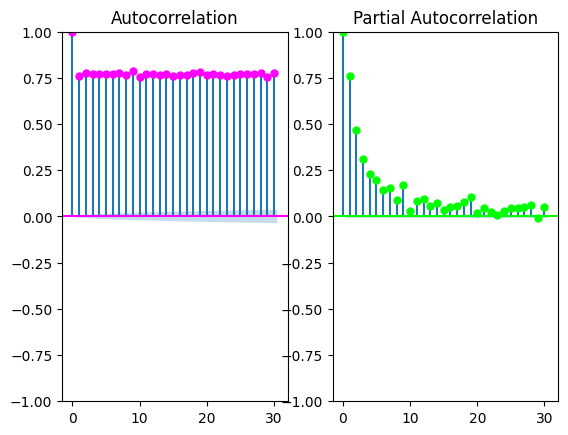

In [617]:
display(StatsForecast.plot(train_df, engine='plotly'))

fig, axs = plt.subplots(nrows=1, ncols=2)
plot_acf(train_df["y"],  lags=30, ax=axs[0],color="fuchsia")
axs[0].set_title("Autocorrelation")
plot_pacf(train_df["y"],  lags=30, ax=axs[1],color="lime")
axs[1].set_title('Partial Autocorrelation')
plt.show()
plt.close(fig)

In [610]:
from statsforecast.utils import ConformalIntervals

# ================================================================
# MODEL INSTANCIATION

season_length = 3 # Define season length depending on the frequency

HORIZON = 12 # Forecast horizon is set to 12 hours
# HORIZON = len(test_df) # number of predictions

CONFIDENCE_LEVEL = 90

# MSTL is not bad, has trouble with big "shocks"
models = [
    MSTL(
        alias="MSTL_AutoARIMA",
        season_length=[24, 24*7],
        trend_forecaster=AutoARIMA(
            # prediction_intervals=ConformalIntervals(n_windows=2, h=HORIZON),
            max_p=5,    # we only predict the non-seasonal part with ARIMA
            # max_d=1,    # Ensure it differences the trend to stabilize it
            # max_q=2,    # Adding a Moving Average term helps smooth out random "shocks"
            # stepwise=True,
            # approximation=True,
        ) # model used to forecast trend
    ),
]

# AutoARIMA alone is shit because there are multiple seasonalities
# models = [
#     AutoARIMA(
#         alias="AutoARIMA",
#         season_length=24,  # 1 season at once for autoarima
#         max_p=3,    # we only predict the non-seasonal part with ARIMA
#         # max_d=1,    # Ensure it differences the trend to stabilize it
#         # max_q=2,    # Adding a Moving Average term helps smooth out random "shocks"
#         # stepwise=True,
#         # approximation=True,
#     ),
# ]

sf_fp = StatsForecast(
    models=models, # models for forecasting
    freq="h",  # frequency of the timestamps
    n_jobs=cpu_cores-2,  # number of jobs to run in parallel, -1 means using all processors
    # verbose=False,
)

# ================================================================
# METHOD 2: FIT/PREDICT

sf_fp.fit(df=train_df.loc[train_df["unique_id"].isin(random_locations)]) # Fit the models to the data using the fit method of the StatsForecast object
# print(sf_fp.fitted_) # Access fitted models from the StatsForecast object

StatsForecast(models=[MSTL_AutoARIMA])

In [568]:
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import mse



Y_fp_df = sf_fp.predict(h=HORIZON, level=[CONFIDENCE_LEVEL]) # Predict or forecast 'horizon' steps ahead using the predict method
# Y_fp_df = sf_fp.predict(h=HORIZON) # Predict or forecast 'horizon' steps ahead using the predict method
# display(Y_fp_df.head()) # Preview the first few rows of the forecasted data

# Rename 'y' in test_df to 'actual' if you want a clearer legend
# test_df_renamed = test_df.rename(columns={'y': 'actual'})
# Y_fp_df.merge(test_df_renamed, on=['unique_id', 'ds'])

evaluation_df = Y_fp_df.merge(test_df[['unique_id', 'ds', 'y']], on=['unique_id', 'ds'])
display(evaluation_df.head())

# ================================================================
# EVALUATE the models (MSE)

results = evaluate(
    df=evaluation_df,
    metrics=[mse], 
    # models=["MSTL_AutoARIMA", "AutoMFLES"], # Or a list of all your model names
    target_col='y'
)
print(results.describe())

# ================================================================
# PLOT Predictions vs Actuals

# Plotting everything together
fig = StatsForecast.plot(
    train_df,
    evaluation_df,
    unique_ids=evaluation_df["unique_id"].unique(),
    max_insample_length=24,  # Zooms in on the last 168 points of training data
    engine='plotly',              # Recommended for interactive zooming
    level=[CONFIDENCE_LEVEL],
)
fig.show()

,unique_id,ds,MSTL_AutoARIMA,MSTL_AutoARIMA-lo-90,MSTL_AutoARIMA-hi-90,y
0,2622727,2025-11-15 00:00:00+01:00,16.640613,13.359654,19.921573,19.0
1,2622727,2025-11-15 01:00:00+01:00,16.734650,12.146486,21.322814,18.0
2,2622727,2025-11-15 02:00:00+01:00,17.712008,12.282242,23.141774,21.0
3,2622727,2025-11-15 03:00:00+01:00,19.898673,13.846929,25.950417,22.0
4,2622727,2025-11-15 04:00:00+01:00,22.026091,15.472694,28.579489,22.0


       MSTL_AutoARIMA
count        8.000000
mean        46.992884
std         62.562612
min          8.079226
25%         18.861784
50%         30.456679
75%         34.636255
max        199.879482


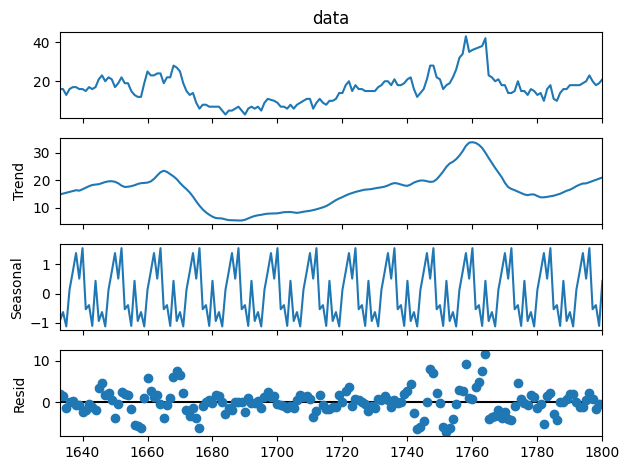

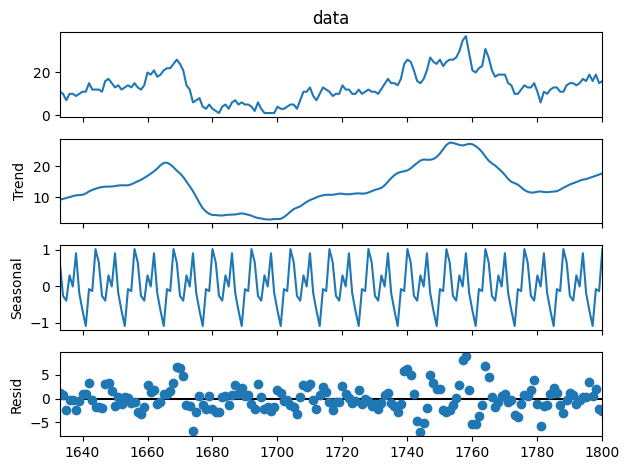

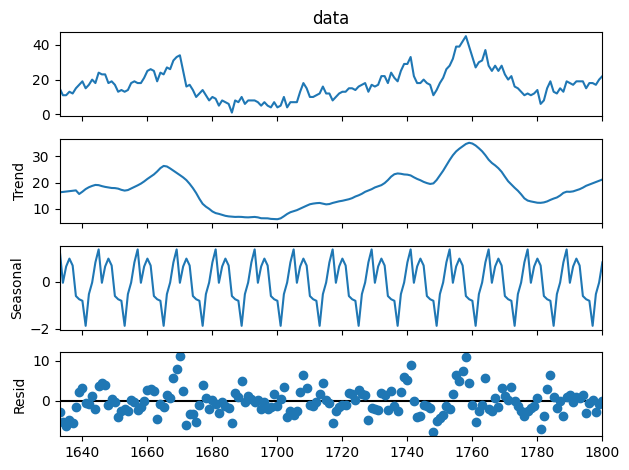

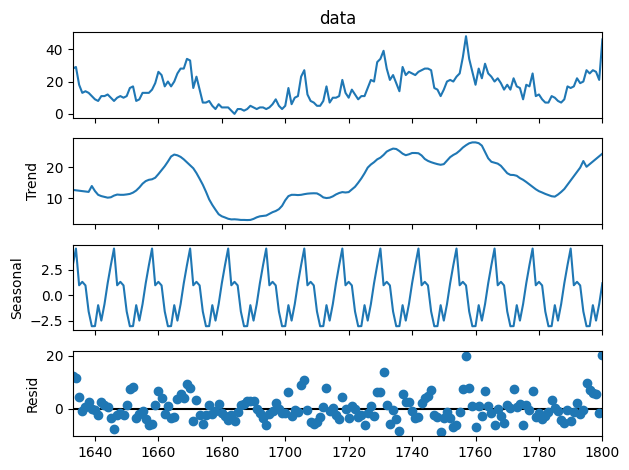

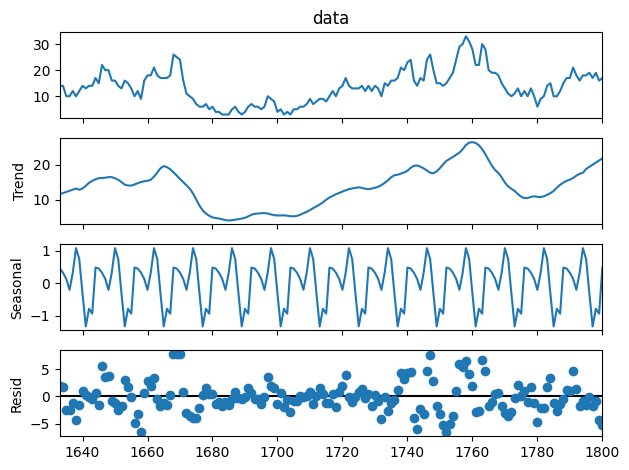

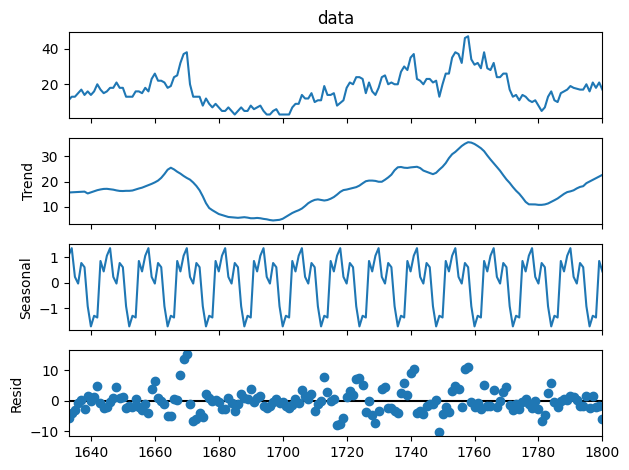

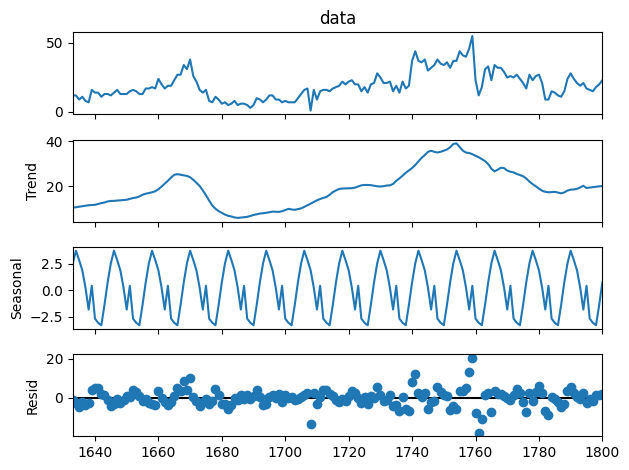

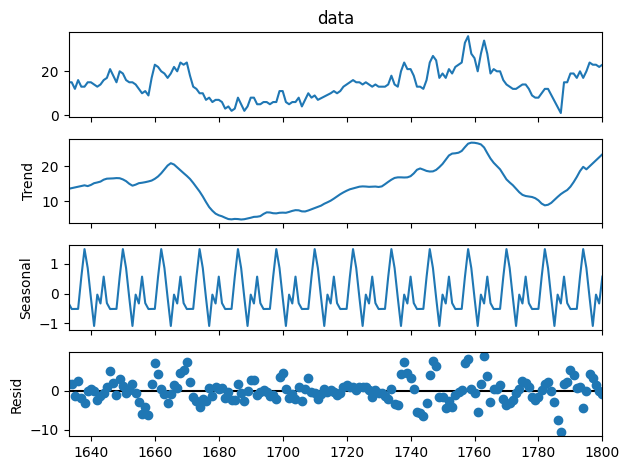

In [544]:
from statsmodels.tsa.seasonal import seasonal_decompose

for i in range(sf_fp.fitted_.shape[0]):
    fitted_df = sf_fp.fitted_[i, 0].model_.tail(24 * 7)
    
    decomposition = seasonal_decompose(fitted_df['data'], period=12, extrapolate_trend='freq')
    # plt.figure(figsize=(12,8))
    decomposition.plot()
    plt.show()



    # fitted_df.plot(subplots=True, grid=True, legend=True, figsize=(12, 6))

In [453]:
# # # Show overall trends/stationarity for all locations/models

# sf_fp.fitted_[0, 0].model_.tail(24 * 28).plot(subplots=True, grid=True)
# plt.tight_layout()
# plt.show()

In [454]:
# sf_fp.fitted_[0, 0].model_["remainder"].tail(24 * 7).plot(subplots=True, grid=True, legend=True, figsize=(12, 4))
# plt.tight_layout()
# plt.show()

In [455]:
# for uid in random_locations:
#     subset_df = cleaned_df[cleaned_df["unique_id"] == uid]
#     result = adfuller(subset_df['y'])
#     adf_stat = result[0]
#     p_value = result[1]
#     crit_values = result[4]
    
#     if adf_stat < crit_values['5%'] and p_value < 0.05:
#         if adf_stat < crit_values['1%']:
#             significance = " 1% "
#         elif adf_stat < crit_values['5%']:
#             significance = " 5% "
#         else:
#             significance = "NULL"
#         print(f"[{uid}] -> [{significance}] The time series is STATIONARY (reject H0): ADF Stat = {adf_stat}, p-value = {p_value}, Critical Value (5%) = {crit_values['5%']}")
#     else:
#         print(f"[{uid}] -> [{significance}] The time series is NON-STATIONARY (fail to reject H0): ADF Stat = {adf_stat}, p-value = {p_value}, Critical Value (5%) = {crit_values['5%']}")
    
#     fig, ax = plt.subplots(2, 1, figsize=(10, 8))
#     plot_acf(subset_df['y'], lags=168, ax=ax[0])
#     plot_pacf(subset_df['y'], lags=168, ax=ax[1])
#     plt.show()
#     plt.close(fig)

In [456]:
# # sf_fp.fitted_[3, 0].model_.tail(24 * 28)
# for i in range(sf_fp.fitted_.shape[0]):
#     fitted_df = sf_fp.fitted_[i, 0].model_.tail(24 * 7)
#     fitted_df.plot(subplots=True, grid=True, legend=True, figsize=(12, 6))

#     # result = adfuller(subset_df['y'])
#     # adf_stat = result[0]
#     # p_value = result[1]
#     # crit_values = result[4]
    
#     # fig, ax = plt.subplots(2, 1, figsize=(10, 8))
#     # plot_acf(fitted_df['data'], lags=200, ax=ax[0])
#     # plot_pacf(fitted_df['data'], lags=200, ax=ax[1])
#     # plt.show()
#     # plt.close(fig)
    
#     # for j in range(sf_fp.fitted_.shape[1]):
#     #     fitted_df = sf_fp.fitted_[i, j].model_.tail(24 * 28)
        
#         # fitted_df.plot(subplots=True, grid=True)
#         # plt.tight_layout()
#         # plt.show()
#         # fitted_df["remainder"].plot(subplots=True, grid=True, legend=True, figsize=(12, 4))
#         # plt.tight_layout()
#         # plt.show()

In [457]:
# Season length: 24 (1:30)
# MSE: mean=66, std=62, min=5, 25%=20, 50%=43, 75%=87, max=260

# Season length: 48 (29:00)
# MSE: mean=65, std=60, min=8, 25%=22, 50%=44, 75%=87, max=260

In [458]:
# fig, ax = plt.subplots(figsize=(24, 6))

# sns.lineplot(
#     data=test_df,
#     x="ds",
#     y="y",
#     hue="unique_id",
#     ax=ax,
# )

## **Process end-to-end**

### Walkthrough

In [459]:
# ================================================================
# CHECK data (random 8)

# StatsForecast.plot(sanitized_df)

In [460]:
# ================================================================
# IMPORT models

from statsforecast.models import (
    HoltWinters,
    CrostonClassic as Croston,
    HistoricAverage,
    DynamicOptimizedTheta as DOT,
    SeasonalNaive
)

# Create a list of models and instantiation parameters
models = [
    HoltWinters(),
    Croston(),
    SeasonalNaive(season_length=24),
    HistoricAverage(),
    DOT(season_length=24)
]
# Instantiate StatsForecast class as sf
sf = StatsForecast(
    models=models,
    freq="h", # pandas frequency
    fallback_model = SeasonalNaive(season_length=7),
    n_jobs=-1,
)

In [461]:
# ================================================================
# FORECAST all models (train/test/predict)

# forecasts_df = sf.forecast(df=cleaned_df, h=48, level=[90])
# forecasts_df.head()

In [462]:
# ================================================================
# PLOT the predictions (random 8)

sf.plot(
    cleaned_df,
    forecasts_df,
    models=["SeasonalNaive"],
    # unique_ids=["2622586"],
    max_insample_length=72,
    level=[90]
)

NameError: name 'forecasts_df' is not defined

In [ ]:
# ================================================================
# CROSS-VALIDATE the models (~8mn)

cv_df = sf.cross_validation(
    df=cleaned_df,
    h=24,
    step_size=24,
    n_windows=2
)
cv_df.head()

In [ ]:
# ================================================================
# EVALUATE the models (MSE)

from utilsforecast.losses import mse

def evaluate_cv(df, metric):
    models = df.columns.drop(['unique_id', 'ds', 'y', 'cutoff']).tolist()
    evals = metric(df, models=models)
    evals['best_model'] = evals[models].idxmin(axis=1)
    return evals

evaluation_df = evaluate_cv(cv_df, mse)
display(evaluation_df.head(5))
print()
evaluation_df['best_model'].value_counts().to_frame().reset_index()


In [ ]:
seasonal_ids = evaluation_df.query('best_model == "DynamicOptimizedTheta"')['unique_id']
sf.plot(
    cleaned_df,
    forecasts_df,
    unique_ids=seasonal_ids,
    models=["CrostonClassic","DynamicOptimizedTheta"],
    # models=["HoltWinters", "CrostonClassic", "SeasonalNaive", "HistoricAverage", "DynamicOptimizedTheta"],
    max_insample_length=168,
)

In [ ]:
# ================================================================
# PRODUCTION: choose the best model for each serie

def get_best_model_forecast(forecasts_df, evaluation_df):
    with_best = forecasts_df.merge(evaluation_df[['unique_id', 'best_model']])
    res = with_best[['unique_id', 'ds']].copy()
    for suffix in ('', '-lo-90', '-hi-90'):
        res[f'best_model{suffix}'] = with_best.apply(lambda row: row[row['best_model'] + suffix], axis=1)
    return res

prod_forecasts_df = get_best_model_forecast(forecasts_df, evaluation_df)
display(prod_forecasts_df.head())

sf.plot(
    cleaned_df,
    prod_forecasts_df,
    max_insample_length=168,
    level=[90],
)




<br>


### *1. Sanitize the data: SQL & Pandas*

> Any steps that is changing the number of rows, rely on time-ordering or changing the number of columns.

- SQL View: perfect grid, feature engineering (fourier terms, holidays, weather...), column selection and renaming
- Pandas: handle all missing values, filter out rows with too much `NaN`, linear/ffill/bfill interpolation (3-6h), add a `is_imputed` column to tell the model which column is "low confidence"

<br><br>

---

<br>

### *2. Preprocess the data: SKLearn*
> Prepare all exogenous variables (new features, weather, traffic...) for the model.
- Imputing, Scaling, OneHotEncoding, PCA...
- Warning: don't double scale ALL *the* features like Fourier Terms

```
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

# We only transform the "raw" weather columns
weather_cols = ['temp', 'humidity', 'wind_speed']

preprocessor = ColumnTransformer(
    transformers=[
        ('scale_weather', StandardScaler(), weather_cols)
    ],
    remainder='passthrough' # Leaves Fourier terms and flags untouched
)
```

<br><br>

---

<br>

### *3. Make forecasts: Nixtla*
- Prepare the features:
```
# Separate the IDs and Target from the features we want to scale
id_cols = ['unique_id', 'ds']
target_col = 'y'
exog_cols = [c for c in df.columns if c not in id_cols + [target_col]]

# Apply the scikit-learn preprocessor to the exogenous columns
# We convert back to DataFrame to keep the column names for StatsForecast
X_scaled = preprocessor.fit_transform(df[exog_cols])
df_clean = pd.concat([df[id_cols + [target_col]],
                     pd.DataFrame(X_scaled, columns=preprocessor.get_feature_names_out())], axis=1)
```

- Make predictions:
```
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA

# Define the exogenous columns the model should look at
dynamic_features = [c for c in df_clean.columns if c not in id_cols + [target_col]]

sf = StatsForecast(
    models=[AutoARIMA(season_length=24)],
    freq='H'
)

# StatsForecast handles the group-by location_id internally!
forecasts = sf.forecast(df=df_clean, h=24, X_df=future_exog_df)
```